# 🔬 NEU-DET Dataset — Comprehensive Exploratory Data Analysis

**Steel Surface Defect Detection | DigiSteel-YOLO Project**

---

## 🎯 Objective
Perform a comprehensive EDA on the NEU-DET dataset to understand every aspect of the data **before training**, guiding our preprocessing, augmentation, and model design decisions.

## 📊 Current Best Results (as of 2026-07-02)

| Model | mAP50 | mAP50-95 | Experiment |
|-------|-------|----------|------------|
| **YOLOv26n** | **0.810** | 0.431 | `15_yolov26n_neudet` |
| YOLOv11n + DAFE | 0.803 | 0.442 | `10_dafe_v4` |
| YOLOv11n baseline | 0.788 | **0.452** | `09_baseline_yolov11n_v2` |

**Target: 0.830 mAP50-95** → Gap: ~0.02-0.05

## 📋 Table of Contents
1. **Install & Import Libraries** — Dependencies and configuration
2. **Dataset Structure Overview** — Directory tree, file counts, formats
3. **Configuration & Path Setup** — Constants, color maps, utility functions
4. **Load & Parse Annotations** — Unified DataFrame from YOLO labels
5. **Dataset Summary Statistics** — High-level dashboard
6. **Class Distribution Analysis** — Imbalance ratios, per-split stratification
7. **Instances Per Image** — Density analysis
8. **Bounding Box Analysis** — Width, height, area distributions
9. **Aspect Ratio Analysis** — Shape patterns per class
10. **Spatial Heatmaps** — Where objects appear in images
11. **Image Dimension Analysis** — Resolution and size patterns
12. **Small/Medium/Large Object Analysis** — Relative size categories
13. **Class Co-occurrence Matrix** — Which defects appear together
14. **Edge & Boundary Objects** — Boxes touching image edges
15. **Image Quality Analysis** — Brightness, contrast, blur detection
16. **CLAHE Preprocessing Comparison** — Raw vs CLAHE vs CLAHE4
17. **Duplicate Detection** — Exact and near-duplicate images
18. **Outlier Detection** — Unusual boxes and images
19. **Class Imbalance Deep Dive** — Effective samples, weights, Gini
20. **Train/Val/Test Split Quality** — Stratification verification
21. **Sample Visualization Gallery** — Representative examples per class
22. **Augmentation Preview** — Transform visualization
23. **Summary & Recommendations** — Actionable next steps with evidence

---
## 1. Install & Import Required Libraries

In [1]:
# =============================================================================
# SECTION 1: INSTALL & IMPORT REQUIRED LIBRARIES
# =============================================================================
import os
import sys
import json
import hashlib
import warnings
from pathlib import Path
from collections import Counter, defaultdict
from itertools import combinations

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image
import cv2
from tqdm import tqdm
from scipy import stats

warnings.filterwarnings('ignore')

# ── Global Plot Configuration ────────────────────────────────────────────────
plt.rcParams.update({
    'figure.figsize': (14, 7),
    'figure.dpi': 120,
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

# Professional color palette for 6 defect classes
CLASS_COLORS = {
    'crazing':          '#E74C3C',  # Red
    'inclusion':        '#3498DB',  # Blue
    'patches':          '#2ECC71',  # Green
    'pitted_surface':   '#F39C12',  # Orange
    'rolled-in_scale':  '#9B59B6',  # Purple
    'scratches':        '#1ABC9C',  # Teal
}

CLASS_NAMES = list(CLASS_COLORS.keys())
CLASS_IDS = {name: idx for idx, name in enumerate(CLASS_NAMES)}
N_CLASSES = len(CLASS_NAMES)

# Split colors for consistent visualization
SPLIT_COLORS = {'train': '#2196F3', 'val': '#FF9800', 'test': '#4CAF50'}

# Seed for reproducibility
np.random.seed(42)

print("✅ All libraries imported successfully")
print(f"   OpenCV:       {cv2.__version__}")
print(f"   NumPy:        {np.__version__}")
print(f"   Pandas:       {pd.__version__}")
print(f"   Matplotlib:   {plt.matplotlib.__version__}")
print(f"   Seaborn:      {sns.__version__}")
print(f"   Classes:      {N_CLASSES} → {CLASS_NAMES}")

✅ All libraries imported successfully
   OpenCV:       4.13.0
   NumPy:        2.4.6
   Pandas:       3.0.3
   Matplotlib:   3.10.9
   Seaborn:      0.13.2
   Classes:      6 → ['crazing', 'inclusion', 'patches', 'pitted_surface', 'rolled-in_scale', 'scratches']


---
## 2. Dataset Structure Overview

In [2]:
# =============================================================================
# SECTION 2: DATASET STRUCTURE OVERVIEW
# =============================================================================
import os
from pathlib import Path

# ── Base paths ───────────────────────────────────────────────────────────────
PROJECT_ROOT = Path(r'D:\DigiSteel-Yolo\DigiSteel-YOLO')
DATASET_ROOT = PROJECT_ROOT / 'datasets' / 'NEU-DET' / 'yolo'

# ── Directory tree ───────────────────────────────────────────────────────────
def print_tree(path, prefix='', max_depth=3, current_depth=0):
    """Print directory tree structure."""
    if current_depth > max_depth:
        return
    entries = sorted(path.iterdir(), key=lambda x: (x.is_file(), x.name))
    for i, entry in enumerate(entries):
        connector = '└── ' if i == len(entries) - 1 else '├── '
        if entry.is_dir():
            count = sum(1 for _ in entry.rglob('*') if _.is_file())
            print(f"{prefix}{connector}{entry.name}/  ({count} files)")
            extension = '    ' if i == len(entries) - 1 else '│   '
            print_tree(entry, prefix + extension, max_depth, current_depth + 1)
        else:
            size_kb = entry.stat().st_size / 1024
            print(f"{prefix}{connector}{entry.name}  ({size_kb:.1f} KB)")

print("=" * 70)
print("📁 NEU-DET DATASET DIRECTORY STRUCTURE")
print("=" * 70)
print(f"Root: {DATASET_ROOT}\n")
print_tree(DATASET_ROOT, max_depth=2)

# ── Count files per split ────────────────────────────────────────────────────
print("\n" + "=" * 70)
print("📊 FILE COUNTS PER SPLIT")
print("=" * 70)

split_data = {}
for split in ['train', 'val', 'test']:
    img_dir = DATASET_ROOT / 'images' / split
    lbl_dir = DATASET_ROOT / 'labels' / split
    
    imgs = sorted([f for f in img_dir.iterdir() if f.suffix.lower() in ('.jpg', '.png', '.bmp', '.jpeg')])
    lbls = sorted([f for f in lbl_dir.iterdir() if f.suffix == '.txt'])
    
    # Check image formats
    formats = Counter(f.suffix.lower() for f in imgs)
    
    # Total size
    total_size_mb = sum(f.stat().st_size for f in imgs) / (1024 * 1024)
    
    split_data[split] = {
        'images': imgs,
        'labels': lbls,
        'n_images': len(imgs),
        'n_labels': len(lbls),
        'formats': dict(formats),
        'size_mb': total_size_mb,
    }
    
    print(f"\n  📂 {split.upper()}")
    print(f"     Images:     {len(imgs):>6,}")
    print(f"     Labels:     {len(lbls):>6,}")
    print(f"     Formats:    {formats}")
    print(f"     Size:       {total_size_mb:.2f} MB")

# ── Validation: images ↔ labels match ────────────────────────────────────────
print("\n" + "=" * 70)
print("✅ IMAGE ↔ LABEL MATCHING VALIDATION")
print("=" * 70)

for split in ['train', 'val', 'test']:
    img_stems = {f.stem for f in split_data[split]['images']}
    lbl_stems = {f.stem for f in split_data[split]['labels']}
    
    missing_labels = img_stems - lbl_stems
    orphan_labels = lbl_stems - img_stems
    
    status = "✅ OK" if not missing_labels and not orphan_labels else "⚠️ MISMATCH"
    print(f"\n  {split.upper()}: {status}")
    if missing_labels:
        print(f"     ⚠️  Images without labels: {len(missing_labels)} → {list(missing_labels)[:5]}")
    if orphan_labels:
        print(f"     ⚠️  Labels without images: {len(orphan_labels)} → {list(orphan_labels)[:5]}")

# ── Check for CLAHE variants ─────────────────────────────────────────────────
print("\n" + "=" * 70)
print("🔍 PREPROCESSED VARIANTS")
print("=" * 70)
neu_det_dir = PROJECT_ROOT / 'datasets' / 'NEU-DET'
for variant in sorted(neu_det_dir.iterdir()):
    if variant.is_dir() and variant.name != 'yolo':
        n_files = sum(1 for _ in variant.rglob('*.jpg'))
        print(f"  📂 {variant.name}/  →  {n_files} images")

total_images = sum(s['n_images'] for s in split_data.values())
total_labels = sum(s['n_labels'] for s in split_data.values())
total_size = sum(s['size_mb'] for s in split_data.values())

print(f"\n{'=' * 70}")
print(f"📈 TOTAL: {total_images:,} images | {total_labels:,} labels | {total_size:.2f} MB")
print(f"{'=' * 70}")

📁 NEU-DET DATASET DIRECTORY STRUCTURE
Root: D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-DET\yolo

├── images/  (1800 files)
│   ├── test/  (166 files)
│   │   ├── crazing_13.jpg  (22.8 KB)
│   │   ├── crazing_151.jpg  (17.1 KB)
│   │   ├── crazing_160.jpg  (21.8 KB)
│   │   ├── crazing_169.jpg  (22.2 KB)
│   │   ├── crazing_17.jpg  (22.3 KB)
│   │   ├── crazing_179.jpg  (22.5 KB)
│   │   ├── crazing_180.jpg  (21.7 KB)
│   │   ├── crazing_19.jpg  (17.8 KB)
│   │   ├── crazing_20.jpg  (20.9 KB)
│   │   ├── crazing_210.jpg  (19.4 KB)
│   │   ├── crazing_214.jpg  (22.6 KB)
│   │   ├── crazing_217.jpg  (22.1 KB)
│   │   ├── crazing_222.jpg  (22.5 KB)
│   │   ├── crazing_224.jpg  (23.0 KB)
│   │   ├── crazing_233.jpg  (22.9 KB)
│   │   ├── crazing_263.jpg  (22.0 KB)
│   │   ├── crazing_292.jpg  (22.7 KB)
│   │   ├── crazing_30.jpg  (21.8 KB)
│   │   ├── crazing_4.jpg  (22.5 KB)
│   │   ├── crazing_55.jpg  (19.7 KB)
│   │   ├── crazing_63.jpg  (19.7 KB)
│   │   ├── crazing_79.jpg  (21.7 KB)

---
## 3. Configuration & Utility Functions

In [3]:
# =============================================================================
# SECTION 3: CONFIGURATION & UTILITY FUNCTIONS
# =============================================================================

# ── YOLO label parser ────────────────────────────────────────────────────────
def parse_yolo_label(label_path, img_width, img_height):
    """
    Parse a YOLO-format label file.
    Returns list of dicts with: class_id, x_center, y_center, width, height (pixel coords)
    YOLO format: class_id x_center y_center width height (all normalized 0-1)
    """
    annotations = []
    if not label_path.exists():
        return annotations
    
    with open(label_path, 'r') as f:
        for line_num, line in enumerate(f, 1):
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            if len(parts) < 5:
                print(f"  ⚠️ Malformed line {line_num} in {label_path.name}: '{line}'")
                continue
            
            try:
                class_id = int(parts[0])
                x_center = float(parts[1]) * img_width
                y_center = float(parts[2]) * img_height
                bbox_w = float(parts[3]) * img_width
                bbox_h = float(parts[4]) * img_height
                
                # Convert to x1, y1, x2, y2
                x1 = x_center - bbox_w / 2
                y1 = y_center - bbox_h / 2
                x2 = x_center + bbox_w / 2
                y2 = y_center + bbox_h / 2
                
                annotations.append({
                    'class_id': class_id,
                    'class_name': CLASS_NAMES[class_id] if class_id < N_CLASSES else f'unknown_{class_id}',
                    'x_center': x_center,
                    'y_center': y_center,
                    'bbox_w': bbox_w,
                    'bbox_h': bbox_h,
                    'bbox_area': bbox_w * bbox_h,
                    'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
                    'aspect_ratio': bbox_w / bbox_h if bbox_h > 0 else 0,
                    'norm_area': (bbox_w * bbox_h) / (img_width * img_height),
                })
            except (ValueError, IndexError) as e:
                print(f"  ⚠️ Parse error line {line_num} in {label_path.name}: {e}")
    
    return annotations


def compute_iou(box1, box2):
    """Compute IoU between two boxes in [x1, y1, x2, y2] format."""
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    inter = max(0, x2 - x1) * max(0, y2 - y1)
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0


def coco_size_category(area):
    """Classify bounding box into COCO size category."""
    if area < 32**2:
        return 'small'
    elif area < 96**2:
        return 'medium'
    else:
        return 'large'


def get_image_brightness(image_path):
    """Compute mean brightness and contrast (std) of an image."""
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None, None
    return float(np.mean(img)), float(np.std(img))


def get_blur_score(image_path):
    """Compute Laplacian variance (higher = sharper)."""
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    return float(cv2.Laplacian(img, cv2.CV_64F).var())


def compute_phash(image_path, hash_size=16):
    """Compute perceptual hash of an image for duplicate detection."""
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    resized = cv2.resize(img, (hash_size + 1, hash_size))
    diff = resized[:, 1:] > resized[:, :-1]
    return diff.flatten()


print("✅ Utility functions defined:")
print("   • parse_yolo_label()    — YOLO label parser")
print("   • compute_iou()         — IoU calculator")
print("   • coco_size_category()  — Small/Medium/Large classifier")
print("   • get_image_brightness() — Brightness & contrast")
print("   • get_blur_score()      — Laplacian blur detection")
print("   • compute_phash()       — Perceptual hash")

✅ Utility functions defined:
   • parse_yolo_label()    — YOLO label parser
   • compute_iou()         — IoU calculator
   • coco_size_category()  — Small/Medium/Large classifier
   • get_image_brightness() — Brightness & contrast
   • get_blur_score()      — Laplacian blur detection
   • compute_phash()       — Perceptual hash


---
## 4. Load & Parse All Annotations into a Unified DataFrame

In [4]:
# =============================================================================
# SECTION 4: LOAD & PARSE ALL ANNOTATIONS
# =============================================================================
import os
from pathlib import Path
from PIL import Image
import pandas as pd
from tqdm import tqdm

DATASET_ROOT = Path(r'D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-DET\yolo')

records = []
image_records = []
parse_errors = 0

print("🔄 Parsing annotations across all splits...\n")

for split in ['train', 'val', 'test']:
    img_dir = DATASET_ROOT / 'images' / split
    lbl_dir = DATASET_ROOT / 'labels' / split
    
    img_files = sorted([f for f in img_dir.iterdir() if f.suffix.lower() in ('.jpg', '.png', '.bmp', '.jpeg')])
    
    for img_path in tqdm(img_files, desc=f"  {split:>5s}", ncols=80):
        lbl_path = lbl_dir / (img_path.stem + '.txt')
        
        # Get image dimensions
        try:
            with Image.open(img_path) as im:
                img_w, img_h = im.size
        except Exception as e:
            parse_errors += 1
            continue
        
        # Store image-level record
        file_size_kb = img_path.stat().st_size / 1024
        image_records.append({
            'image_id': img_path.stem,
            'image_path': str(img_path),
            'image_width': img_w,
            'image_height': img_h,
            'file_size_kb': file_size_kb,
            'split': split,
            'format': img_path.suffix.lower(),
        })
        
        # Parse annotations
        annotations = parse_yolo_label(lbl_path, img_w, img_h)
        
        for ann in annotations:
            records.append({
                'image_id': img_path.stem,
                'image_path': str(img_path),
                'image_width': img_w,
                'image_height': img_h,
                'split': split,
                **ann,
            })

# Build DataFrames
df_ann = pd.DataFrame(records)
df_img = pd.DataFrame(image_records)

# Add derived columns
if len(df_ann) > 0:
    df_ann['size_category'] = df_ann['bbox_area'].apply(coco_size_category)
    df_ann['relative_area'] = df_ann['norm_area'] * 100  # percentage

print(f"\n{'=' * 70}")
print(f"✅ ANNOTATION PARSING COMPLETE")
print(f"{'=' * 70}")
print(f"   Total images parsed:      {len(df_img):,}")
print(f"   Total annotations:        {len(df_ann):,}")
print(f"   Parse errors:             {parse_errors}")
print(f"   Avg annotations/image:    {len(df_ann) / len(df_img):.2f}")
print(f"\n   DataFrame shape (df_ann):  {df_ann.shape}")
print(f"   DataFrame shape (df_img):  {df_img.shape}")

# Quick preview
print("\n📋 Annotation DataFrame preview:")
df_ann.head(10)

🔄 Parsing annotations across all splits...



   test: 100%|██████████████████████████████| 166/166 [00:00<00:00, 6359.53it/s]



✅ ANNOTATION PARSING COMPLETE
   Total images parsed:      1,800
   Total annotations:        4,189
   Parse errors:             0
   Avg annotations/image:    2.33

   DataFrame shape (df_ann):  (4189, 20)
   DataFrame shape (df_img):  (1800, 7)

📋 Annotation DataFrame preview:


,image_id,image_path,image_width,image_height,split,class_id,class_name,x_center,y_center,bbox_w,bbox_h,bbox_area,x1,y1,x2,y2,aspect_ratio,norm_area,size_category,relative_area
0,crazing_1,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,97.5,98.0,191.0,192.0,36672.0,2.0,2.0,193.0,194.0,0.994792,0.916800,large,91.6800
1,crazing_101,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,113.5,82.0,147.0,140.0,20580.0,40.0,12.0,187.0,152.0,1.050000,0.514500,large,51.4500
2,crazing_104,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,57.0,70.0,106.0,132.0,13992.0,4.0,4.0,110.0,136.0,0.803030,0.349800,large,34.9800
3,crazing_104,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,169.5,33.0,55.0,46.0,2530.0,142.0,10.0,197.0,56.0,1.195652,0.063250,medium,6.3250
4,crazing_104,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,168.0,79.0,62.0,74.0,4588.0,137.0,42.0,199.0,116.0,0.837838,0.114700,medium,11.4700
5,crazing_104,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,2,patches,98.0,184.5,40.0,31.0,1240.0,78.0,169.0,118.0,200.0,1.290323,0.031000,medium,3.1000
6,crazing_105,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,58.5,68.5,109.0,131.0,14279.0,4.0,3.0,113.0,134.0,0.832061,0.356975,large,35.6975
7,crazing_105,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,165.0,75.0,64.0,148.0,9472.0,133.0,1.0,197.0,149.0,0.432432,0.236800,large,23.6800
8,crazing_105,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,0,crazing,128.0,23.0,138.0,44.0,6072.0,59.0,1.0,197.0,45.0,3.136364,0.151800,medium,15.1800
9,crazing_105,D:\DigiSteel-Yolo\DigiSteel-YOLO\datasets\NEU-...,200,200,train,1,inclusion,63.0,108.0,116.0,34.0,3944.0,5.0,91.0,121.0,125.0,3.411765,0.098600,medium,9.8600


---
## 5. Dataset Summary Statistics Dashboard

📊 DATASET SUMMARY STATISTICS
Split  Images  Annotations Avg Ann/Image Median Ann/Image  Unique Classes Size (MB)
TRAIN    1290         2997          2.32                2               6      18.2
  VAL     344          821          2.39                2               6       4.9
 TEST     166          371          2.23                2               6       2.4
TOTAL    1800         4189          2.33                2               6      25.5


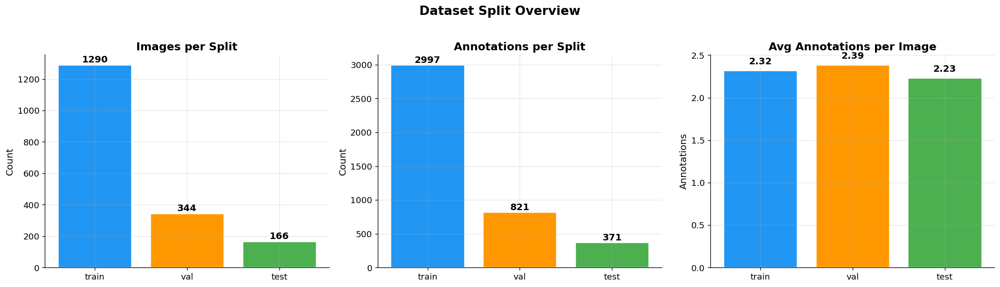

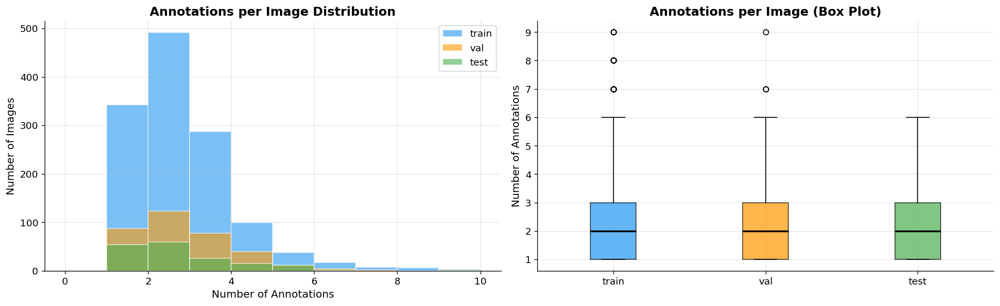


📈 Annotations per Image Statistics:
        count  mean   std  min  25%  50%  75%  max
split                                             
test    166.0  2.23  1.22  1.0  1.0  2.0  3.0  6.0
train  1290.0  2.32  1.26  1.0  1.0  2.0  3.0  9.0
val     344.0  2.39  1.24  1.0  1.0  2.0  3.0  9.0


In [5]:
# =============================================================================
# SECTION 5: DATASET SUMMARY STATISTICS
# =============================================================================

# ── Per-split summary table ──────────────────────────────────────────────────
summary_rows = []
for split in ['train', 'val', 'test']:
    df_split_img = df_img[df_img['split'] == split]
    df_split_ann = df_ann[df_ann['split'] == split]
    n_imgs = len(df_split_img)
    n_anns = len(df_split_ann)
    avg_ann = n_anns / n_imgs if n_imgs > 0 else 0
    med_ann = df_split_ann.groupby('image_id').size().median() if n_imgs > 0 else 0
    size_mb = df_split_img['file_size_kb'].sum() / 1024
    
    summary_rows.append({
        'Split': split.upper(),
        'Images': n_imgs,
        'Annotations': n_anns,
        'Avg Ann/Image': f"{avg_ann:.2f}",
        'Median Ann/Image': f"{med_ann:.0f}",
        'Unique Classes': df_split_ann['class_id'].nunique(),
        'Size (MB)': f"{size_mb:.1f}",
    })

# Add total row
summary_rows.append({
    'Split': 'TOTAL',
    'Images': len(df_img),
    'Annotations': len(df_ann),
    'Avg Ann/Image': f"{len(df_ann) / len(df_img):.2f}",
    'Median Ann/Image': f"{df_ann.groupby('image_id').size().median():.0f}",
    'Unique Classes': df_ann['class_id'].nunique(),
    'Size (MB)': f"{df_img['file_size_kb'].sum() / 1024:.1f}",
})

df_summary = pd.DataFrame(summary_rows)
print("📊 DATASET SUMMARY STATISTICS")
print("=" * 90)
print(df_summary.to_string(index=False))

# ── Visualization: Images & Annotations per split ────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

splits = ['train', 'val', 'test']
split_imgs = [len(df_img[df_img['split'] == s]) for s in splits]
split_anns = [len(df_ann[df_ann['split'] == s]) for s in splits]

# Bar 1: Images per split
bars1 = axes[0].bar(splits, split_imgs, color=[SPLIT_COLORS[s] for s in splits], edgecolor='white', linewidth=1.5)
axes[0].set_title('Images per Split', fontweight='bold')
axes[0].set_ylabel('Count')
for bar, val in zip(bars1, split_imgs):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, str(val), 
                ha='center', va='bottom', fontweight='bold', fontsize=12)

# Bar 2: Annotations per split
bars2 = axes[1].bar(splits, split_anns, color=[SPLIT_COLORS[s] for s in splits], edgecolor='white', linewidth=1.5)
axes[1].set_title('Annotations per Split', fontweight='bold')
axes[1].set_ylabel('Count')
for bar, val in zip(bars2, split_anns):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, str(val), 
                ha='center', va='bottom', fontweight='bold', fontsize=12)

# Bar 3: Avg annotations per image per split
avg_anns = [split_anns[i] / split_imgs[i] if split_imgs[i] > 0 else 0 for i in range(3)]
bars3 = axes[2].bar(splits, avg_anns, color=[SPLIT_COLORS[s] for s in splits], edgecolor='white', linewidth=1.5)
axes[2].set_title('Avg Annotations per Image', fontweight='bold')
axes[2].set_ylabel('Annotations')
for bar, val in zip(bars3, avg_anns):
    axes[2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f"{val:.2f}", 
                ha='center', va='bottom', fontweight='bold', fontsize=12)

plt.suptitle('Dataset Split Overview', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── Annotations per image distribution ───────────────────────────────────────
anns_per_img = df_ann.groupby(['image_id', 'split']).size().reset_index(name='n_anns')

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Histogram
for split in splits:
    data = anns_per_img[anns_per_img['split'] == split]['n_anns']
    axes[0].hist(data, bins=range(0, data.max() + 2), alpha=0.6, label=split, 
                color=SPLIT_COLORS[split], edgecolor='white')
axes[0].set_title('Annotations per Image Distribution', fontweight='bold')
axes[0].set_xlabel('Number of Annotations')
axes[0].set_ylabel('Number of Images')
axes[0].legend()

# Box plot
split_data_list = [anns_per_img[anns_per_img['split'] == s]['n_anns'].values for s in splits]
bp = axes[1].boxplot(split_data_list, labels=splits, patch_artist=True, 
                     boxprops=dict(alpha=0.7),
                     medianprops=dict(color='black', linewidth=2))
for patch, color in zip(bp['boxes'], [SPLIT_COLORS[s] for s in splits]):
    patch.set_facecolor(color)
axes[1].set_title('Annotations per Image (Box Plot)', fontweight='bold')
axes[1].set_ylabel('Number of Annotations')

plt.tight_layout()
plt.show()

# Print statistics
print("\n📈 Annotations per Image Statistics:")
print(anns_per_img.groupby('split')['n_anns'].describe().round(2).to_string())

---
## 6. Class Distribution Analysis

📊 OVERALL CLASS DISTRIBUTION
               crazing:   689  ( 16.4%)  ████████
             inclusion: 1,011  ( 24.1%)  ████████████
               patches:   881  ( 21.0%)  ██████████
        pitted_surface:   432  ( 10.3%)  █████
       rolled-in_scale:   628  ( 15.0%)  ███████
             scratches:   548  ( 13.1%)  ██████

  ⚖️  Imbalance Ratio (max/min): 2.34x
  📉 Most frequent:   inclusion (1,011)
  📈 Least frequent:  pitted_surface (432)


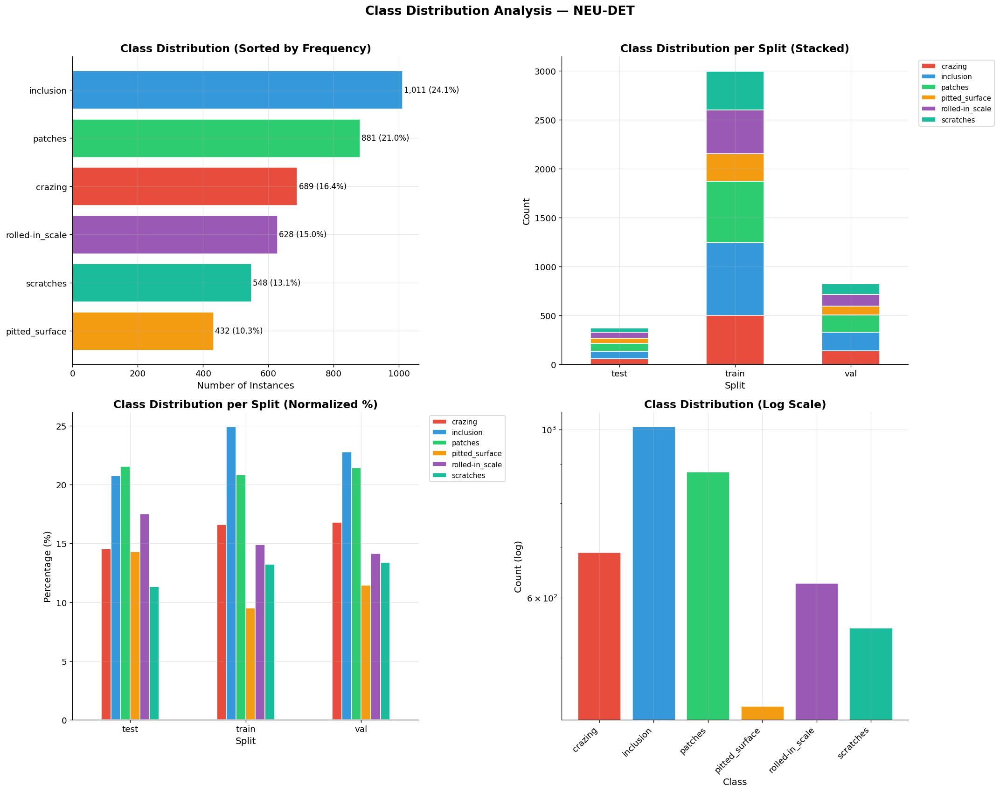


📋 Detailed Class × Split Count Table:
split            train  val  test   All
class_name                             
crazing            497  138    54   689
inclusion          747  187    77  1011
patches            625  176    80   881
pitted_surface     285   94    53   432
rolled-in_scale    447  116    65   628
scratches          396  110    42   548
All               2997  821   371  4189


In [6]:
# =============================================================================
# SECTION 6: CLASS DISTRIBUTION ANALYSIS
# =============================================================================

# ── Overall class distribution ───────────────────────────────────────────────
class_counts = df_ann['class_name'].value_counts()
class_pct = (class_counts / class_counts.sum() * 100).round(2)

print("📊 OVERALL CLASS DISTRIBUTION")
print("=" * 60)
for name in CLASS_NAMES:
    cnt = class_counts.get(name, 0)
    pct = class_pct.get(name, 0)
    bar = '█' * int(pct / 2)
    print(f"  {name:>20s}: {cnt:>5,}  ({pct:>5.1f}%)  {bar}")

# Imbalance ratio
max_cls = class_counts.max()
min_cls = class_counts.min()
imbalance_ratio = max_cls / min_cls
print(f"\n  ⚖️  Imbalance Ratio (max/min): {imbalance_ratio:.2f}x")
print(f"  📉 Most frequent:   {class_counts.idxmax()} ({max_cls:,})")
print(f"  📈 Least frequent:  {class_counts.idxmin()} ({min_cls:,})")

# ── Visualization: 4-panel class distribution ────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Panel 1: Overall bar chart (sorted)
sorted_classes = class_counts.sort_values(ascending=True)
colors = [CLASS_COLORS[c] for c in sorted_classes.index]
bars = axes[0, 0].barh(sorted_classes.index, sorted_classes.values, color=colors, edgecolor='white', linewidth=1.5)
axes[0, 0].set_title('Class Distribution (Sorted by Frequency)', fontweight='bold', fontsize=14)
axes[0, 0].set_xlabel('Number of Instances')
for bar, val in zip(bars, sorted_classes.values):
    axes[0, 0].text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2, 
                    f'{val:,} ({val/class_counts.sum()*100:.1f}%)', 
                    va='center', fontsize=10)

# Panel 2: Stacked bar per split
class_split = df_ann.groupby(['split', 'class_name']).size().unstack(fill_value=0)
class_split = class_split.reindex(columns=CLASS_NAMES, fill_value=0)
class_split.plot(kind='bar', stacked=True, ax=axes[0, 1], 
                 color=[CLASS_COLORS[c] for c in CLASS_NAMES],
                 edgecolor='white', linewidth=1)
axes[0, 1].set_title('Class Distribution per Split (Stacked)', fontweight='bold', fontsize=14)
axes[0, 1].set_xlabel('Split')
axes[0, 1].set_ylabel('Count')
axes[0, 1].legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=0)

# Panel 3: Grouped bar per split
class_split_norm = class_split.div(class_split.sum(axis=1), axis=0) * 100
class_split_norm.plot(kind='bar', ax=axes[1, 0],
                      color=[CLASS_COLORS[c] for c in CLASS_NAMES],
                      edgecolor='white', linewidth=1)
axes[1, 0].set_title('Class Distribution per Split (Normalized %)', fontweight='bold', fontsize=14)
axes[1, 0].set_xlabel('Split')
axes[1, 0].set_ylabel('Percentage (%)')
axes[1, 0].legend(bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=0)

# Panel 4: Log-scaled distribution to reveal tail classes
axes[1, 1].bar(range(N_CLASSES), class_counts.reindex(CLASS_NAMES).values, 
               color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white', linewidth=1.5)
axes[1, 1].set_yscale('log')
axes[1, 1].set_title('Class Distribution (Log Scale)', fontweight='bold', fontsize=14)
axes[1, 1].set_xlabel('Class')
axes[1, 1].set_ylabel('Count (log)')
axes[1, 1].set_xticks(range(N_CLASSES))
axes[1, 1].set_xticklabels(CLASS_NAMES, rotation=45, ha='right')

plt.suptitle('Class Distribution Analysis — NEU-DET', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# ── Per-class per-split table ────────────────────────────────────────────────
print("\n📋 Detailed Class × Split Count Table:")
cross_tab = pd.crosstab(df_ann['class_name'], df_ann['split'], margins=True)
cross_tab = cross_tab.reindex(index=CLASS_NAMES + ['All'], columns=['train', 'val', 'test', 'All'], fill_value=0)
print(cross_tab.to_string())

---
## 7. Bounding Box Analysis — Width, Height, Area

---
## 7. Instances Per Image — Density Analysis

📊 INSTANCES PER IMAGE STATISTICS
        count  mean   std  min  25%  50%  75%  max
split                                             
test    166.0  2.23  1.22  1.0  1.0  2.0  3.0  6.0
train  1290.0  2.32  1.26  1.0  1.0  2.0  3.0  9.0
val     344.0  2.39  1.24  1.0  1.0  2.0  3.0  9.0

  Overall: mean=2.33  median=2  max=9  std=1.25

📊 PER-CLASS INSTANCES PER IMAGE
               crazing: mean=2.30  median=2  max=5  images=300
             inclusion: mean=2.65  median=2  max=9  images=382
               patches: mean=2.58  median=2  max=6  images=342
        pitted_surface: mean=1.44  median=1  max=5  images=301
       rolled-in_scale: mean=2.09  median=2  max=4  images=300
             scratches: mean=1.83  median=2  max=5  images=300


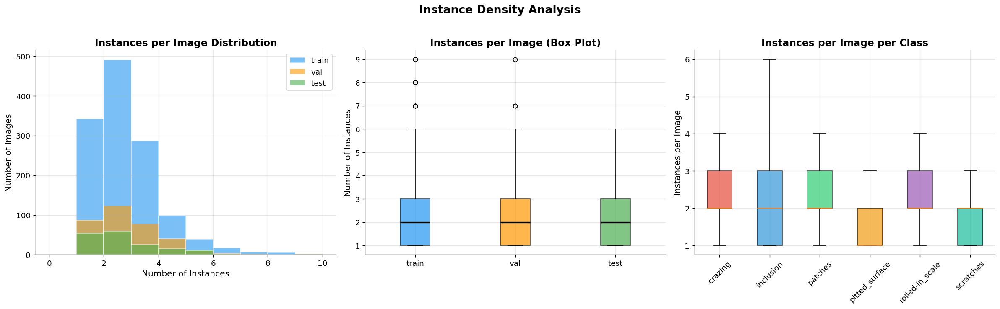


📸 DENSEST IMAGES (most instances):
  inclusion_125: 9 instances (val)
  inclusion_130: 9 instances (train)
  inclusion_18: 9 instances (train)
  inclusion_28: 9 instances (train)
  inclusion_27: 8 instances (train)

📸 SPARSEST IMAGES (fewest instances):
  crazing_1: 1 instances (train)
  crazing_101: 1 instances (train)
  crazing_123: 1 instances (train)
  crazing_14: 1 instances (train)
  crazing_146: 1 instances (train)

💡 Images with many instances → dense scenes, harder to detect individual defects
   Images with few instances → easier but may have larger defects


In [7]:
# =============================================================================
# SECTION 7: INSTANCES PER IMAGE — DENSITY ANALYSIS
# =============================================================================

# ── Compute instances per image ──────────────────────────────────────────────
instances_per_img = df_ann.groupby(['image_id', 'split']).size().reset_index(name='n_instances')

print("📊 INSTANCES PER IMAGE STATISTICS")
print("=" * 70)
print(instances_per_img.groupby('split')['n_instances'].describe().round(2).to_string())

# ── Overall statistics ───────────────────────────────────────────────────────
mean_inst = instances_per_img['n_instances'].mean()
median_inst = instances_per_img['n_instances'].median()
max_inst = instances_per_img['n_instances'].max()
std_inst = instances_per_img['n_instances'].std()

print(f"\n  Overall: mean={mean_inst:.2f}  median={median_inst:.0f}  max={max_inst}  std={std_inst:.2f}")

# ── Per-class instances per image ────────────────────────────────────────────
print("\n📊 PER-CLASS INSTANCES PER IMAGE")
print("=" * 70)
for cls in CLASS_NAMES:
    cls_anns = df_ann[df_ann['class_name'] == cls]
    cls_per_img = cls_anns.groupby('image_id').size()
    if len(cls_per_img) > 0:
        print(f"  {cls:>20s}: mean={cls_per_img.mean():.2f}  median={cls_per_img.median():.0f}  max={cls_per_img.max()}  images={len(cls_per_img)}")

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 1. Overall histogram
for split in ['train', 'val', 'test']:
    data = instances_per_img[instances_per_img['split'] == split]['n_instances']
    axes[0].hist(data, bins=range(0, data.max() + 2), alpha=0.6, label=split,
                color=SPLIT_COLORS[split], edgecolor='white')
axes[0].set_title('Instances per Image Distribution', fontweight='bold')
axes[0].set_xlabel('Number of Instances')
axes[0].set_ylabel('Number of Images')
axes[0].legend()

# 2. Box plot per split
split_data_list = [instances_per_img[instances_per_img['split'] == s]['n_instances'].values for s in splits]
bp = axes[1].boxplot(split_data_list, labels=splits, patch_artist=True,
                     boxprops=dict(alpha=0.7), medianprops=dict(color='black', linewidth=2))
for patch, color in zip(bp['boxes'], [SPLIT_COLORS[s] for s in splits]):
    patch.set_facecolor(color)
axes[1].set_title('Instances per Image (Box Plot)', fontweight='bold')
axes[1].set_ylabel('Number of Instances')

# 3. Per-class instances per image
cls_inst_data = []
cls_inst_labels = []
for cls in CLASS_NAMES:
    cls_anns = df_ann[df_ann['class_name'] == cls]
    cls_per_img = cls_anns.groupby('image_id').size()
    cls_inst_data.append(cls_per_img.values)
    cls_inst_labels.append(cls)

bp2 = axes[2].boxplot(cls_inst_data, labels=cls_inst_labels, patch_artist=True, showfliers=False)
for patch, cls in zip(bp2['boxes'], CLASS_NAMES):
    patch.set_facecolor(CLASS_COLORS[cls])
    patch.set_alpha(0.7)
axes[2].set_title('Instances per Image per Class', fontweight='bold')
axes[2].set_ylabel('Instances per Image')
axes[2].tick_params(axis='x', rotation=45)

plt.suptitle('Instance Density Analysis', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── Dense and sparse images ──────────────────────────────────────────────────
print("\n📸 DENSEST IMAGES (most instances):")
dense = instances_per_img.nlargest(5, 'n_instances')
for _, row in dense.iterrows():
    print(f"  {row['image_id']}: {row['n_instances']} instances ({row['split']})")

print("\n📸 SPARSEST IMAGES (fewest instances):")
sparse = instances_per_img.nsmallest(5, 'n_instances')
for _, row in sparse.iterrows():
    print(f"  {row['image_id']}: {row['n_instances']} instances ({row['split']})")

print(f"\n💡 Images with many instances → dense scenes, harder to detect individual defects")
print(f"   Images with few instances → easier but may have larger defects")

📐 BOUNDING BOX DIMENSION STATISTICS
        bbox_w   bbox_h  bbox_area  aspect_ratio  relative_area
count  4189.00  4189.00    4189.00       4189.00        4189.00
mean     71.40    95.01    6980.19          1.13          17.45
std      52.04    56.54    7546.10          1.52          18.87
min       8.00     9.00     108.00          0.05           0.27
5%       15.00    26.00     666.00          0.14           1.67
25%      30.00    50.00    2052.00          0.37           5.13
50%      55.00    77.00    4715.00          0.68          11.79
75%     100.00   136.00    8763.00          1.26          21.91
95%     188.60   197.00   22788.00          3.30          56.97
max     199.00   199.00   39601.00         18.00          99.00

📐 PER-CLASS BOUNDING BOX STATISTICS

  crazing:
    Width:  mean=125.1  median=126.0  std=40.5
    Height: mean=75.3  median=70.0  std=27.6
    Area:   mean=9236.1  median=8456.0

  inclusion:
    Width:  mean=28.5  median=25.0  std=14.6
    Height: mean=85.1

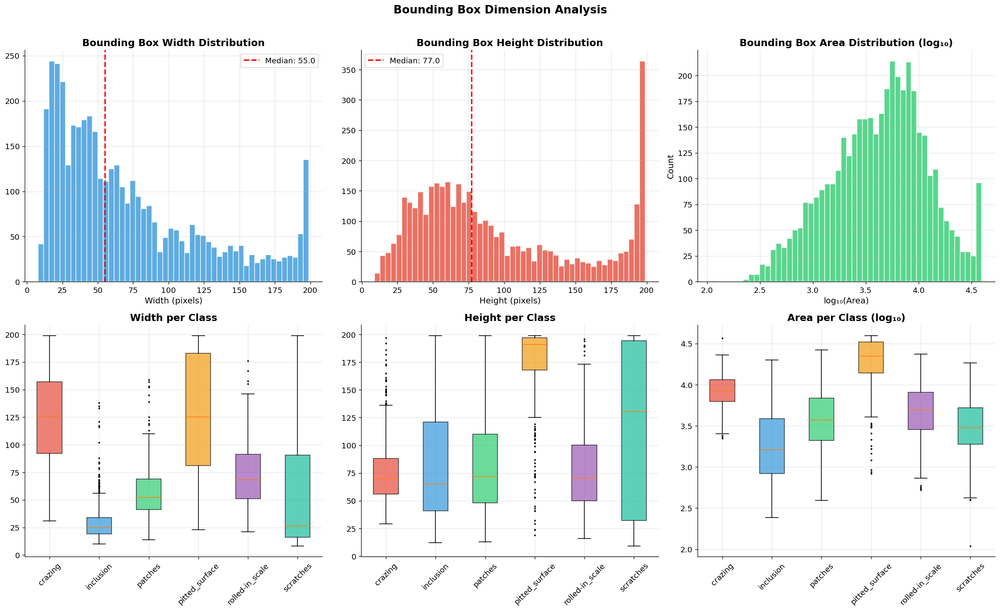

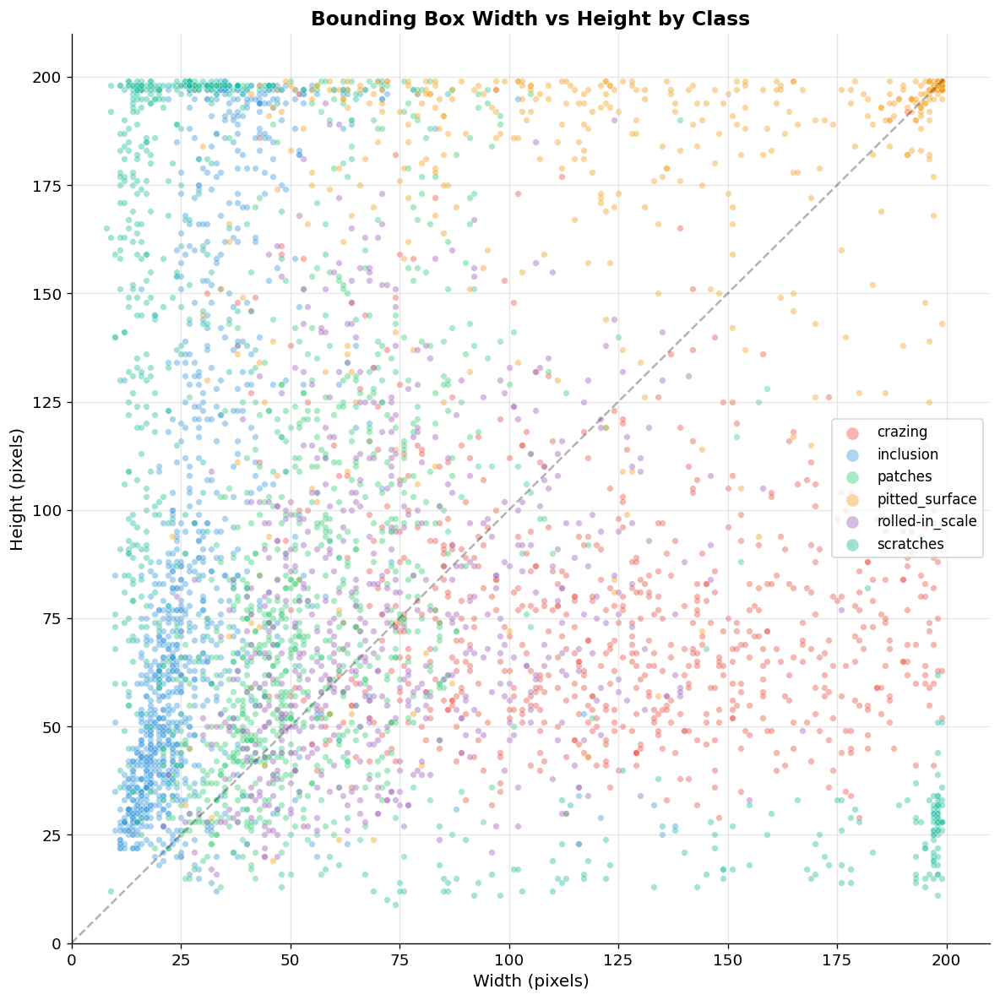

In [8]:
# =============================================================================
# SECTION 7: BOUNDING BOX ANALYSIS — WIDTH, HEIGHT, AREA
# =============================================================================

# ── Statistical summary ──────────────────────────────────────────────────────
print("📐 BOUNDING BOX DIMENSION STATISTICS")
print("=" * 70)
bbox_stats = df_ann[['bbox_w', 'bbox_h', 'bbox_area', 'aspect_ratio', 'relative_area']].describe(percentiles=[.05, .25, .5, .75, .95])
print(bbox_stats.round(2).to_string())

# ── Per-class statistics ─────────────────────────────────────────────────────
print("\n📐 PER-CLASS BOUNDING BOX STATISTICS")
print("=" * 70)
per_class_stats = df_ann.groupby('class_name')[['bbox_w', 'bbox_h', 'bbox_area', 'aspect_ratio']].agg(['mean', 'median', 'std', 'min', 'max'])
for cls in CLASS_NAMES:
    if cls in per_class_stats.index:
        print(f"\n  {cls}:")
        print(f"    Width:  mean={per_class_stats.loc[cls, ('bbox_w', 'mean')]:.1f}  median={per_class_stats.loc[cls, ('bbox_w', 'median')]:.1f}  std={per_class_stats.loc[cls, ('bbox_w', 'std')]:.1f}")
        print(f"    Height: mean={per_class_stats.loc[cls, ('bbox_h', 'mean')]:.1f}  median={per_class_stats.loc[cls, ('bbox_h', 'median')]:.1f}  std={per_class_stats.loc[cls, ('bbox_h', 'std')]:.1f}")
        print(f"    Area:   mean={per_class_stats.loc[cls, ('bbox_area', 'mean')]:.1f}  median={per_class_stats.loc[cls, ('bbox_area', 'median')]:.1f}")

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Row 1: Overall distributions
# Width distribution
axes[0, 0].hist(df_ann['bbox_w'], bins=50, color='#3498DB', edgecolor='white', alpha=0.8)
axes[0, 0].axvline(df_ann['bbox_w'].median(), color='red', linestyle='--', linewidth=2, label=f"Median: {df_ann['bbox_w'].median():.1f}")
axes[0, 0].set_title('Bounding Box Width Distribution', fontweight='bold')
axes[0, 0].set_xlabel('Width (pixels)')
axes[0, 0].legend()

# Height distribution
axes[0, 1].hist(df_ann['bbox_h'], bins=50, color='#E74C3C', edgecolor='white', alpha=0.8)
axes[0, 1].axvline(df_ann['bbox_h'].median(), color='red', linestyle='--', linewidth=2, label=f"Median: {df_ann['bbox_h'].median():.1f}")
axes[0, 1].set_title('Bounding Box Height Distribution', fontweight='bold')
axes[0, 1].set_xlabel('Height (pixels)')
axes[0, 1].legend()

# Area distribution (log scale)
axes[0, 2].hist(np.log10(df_ann['bbox_area'] + 1), bins=50, color='#2ECC71', edgecolor='white', alpha=0.8)
axes[0, 2].set_title('Bounding Box Area Distribution (log₁₀)', fontweight='bold')
axes[0, 2].set_xlabel('log₁₀(Area)')
axes[0, 2].set_ylabel('Count')

# Row 2: Per-class box plots
# Width per class
class_order = CLASS_NAMES
data_w = [df_ann[df_ann['class_name'] == c]['bbox_w'].values for c in class_order]
bp1 = axes[1, 0].boxplot(data_w, labels=class_order, patch_artist=True, showfliers=True, flierprops=dict(marker='.', markersize=3))
for patch, cls in zip(bp1['boxes'], class_order):
    patch.set_facecolor(CLASS_COLORS[cls])
    patch.set_alpha(0.7)
axes[1, 0].set_title('Width per Class', fontweight='bold')
axes[1, 0].tick_params(axis='x', rotation=45)

# Height per class
data_h = [df_ann[df_ann['class_name'] == c]['bbox_h'].values for c in class_order]
bp2 = axes[1, 1].boxplot(data_h, labels=class_order, patch_artist=True, showfliers=True, flierprops=dict(marker='.', markersize=3))
for patch, cls in zip(bp2['boxes'], class_order):
    patch.set_facecolor(CLASS_COLORS[cls])
    patch.set_alpha(0.7)
axes[1, 1].set_title('Height per Class', fontweight='bold')
axes[1, 1].tick_params(axis='x', rotation=45)

# Area per class (log scale)
data_a = [np.log10(df_ann[df_ann['class_name'] == c]['bbox_area'].values + 1) for c in class_order]
bp3 = axes[1, 2].boxplot(data_a, labels=class_order, patch_artist=True, showfliers=True, flierprops=dict(marker='.', markersize=3))
for patch, cls in zip(bp3['boxes'], class_order):
    patch.set_facecolor(CLASS_COLORS[cls])
    patch.set_alpha(0.7)
axes[1, 2].set_title('Area per Class (log₁₀)', fontweight='bold')
axes[1, 2].tick_params(axis='x', rotation=45)

plt.suptitle('Bounding Box Dimension Analysis', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# ── Width vs Height scatter ──────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 10))
for cls in CLASS_NAMES:
    mask = df_ann['class_name'] == cls
    ax.scatter(df_ann[mask]['bbox_w'], df_ann[mask]['bbox_h'], 
              c=CLASS_COLORS[cls], label=cls, alpha=0.4, s=20, edgecolors='white', linewidth=0.3)
ax.set_title('Bounding Box Width vs Height by Class', fontweight='bold', fontsize=14)
ax.set_xlabel('Width (pixels)')
ax.set_ylabel('Height (pixels)')
ax.legend(markerscale=2, fontsize=10)
ax.plot([0, 200], [0, 200], 'k--', alpha=0.3, label='Square (1:1)')
ax.set_xlim(0)
ax.set_ylim(0)
plt.tight_layout()
plt.show()

---
## 8. Aspect Ratio Analysis — Shape Patterns per Class

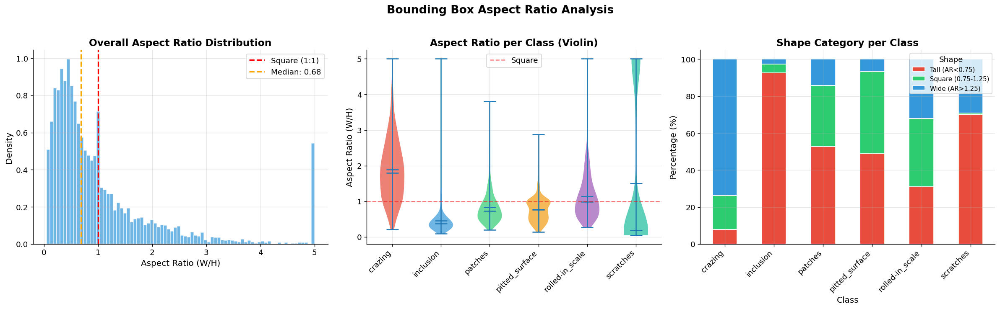

📐 SHAPE CATEGORY SUMMARY
             Tall (AR<0.75): 2,247  ( 53.6%)
         Square (0.75-1.25):   892  ( 21.3%)
             Wide (AR>1.25): 1,050  ( 25.1%)

💡 This informs anchor box design — YOLOv11 uses anchor-free detection,
   but understanding shape patterns helps with augmentation strategy.


In [9]:
# =============================================================================
# SECTION 8: ASPECT RATIO ANALYSIS
# =============================================================================

# ── Overall aspect ratio distribution ────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Overall histogram + KDE
ar = df_ann['aspect_ratio'].clip(0, 5)  # Clip extremes for visualization
axes[0].hist(ar, bins=80, density=True, color='#3498DB', edgecolor='white', alpha=0.7)
axes[0].axvline(1.0, color='red', linestyle='--', linewidth=2, label='Square (1:1)')
axes[0].axvline(ar.median(), color='orange', linestyle='--', linewidth=2, label=f'Median: {ar.median():.2f}')
axes[0].set_title('Overall Aspect Ratio Distribution', fontweight='bold')
axes[0].set_xlabel('Aspect Ratio (W/H)')
axes[0].set_ylabel('Density')
axes[0].legend()

# Per-class violin plot
violin_data = []
violin_labels = []
for cls in CLASS_NAMES:
    cls_ar = df_ann[df_ann['class_name'] == cls]['aspect_ratio'].clip(0, 5).values
    violin_data.append(cls_ar)
    violin_labels.append(cls)

parts = axes[1].violinplot(violin_data, positions=range(N_CLASSES), showmeans=True, showmedians=True)
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(CLASS_COLORS[CLASS_NAMES[i]])
    pc.set_alpha(0.7)
axes[1].set_xticks(range(N_CLASSES))
axes[1].set_xticklabels(violin_labels, rotation=45, ha='right')
axes[1].axhline(1.0, color='red', linestyle='--', alpha=0.5, label='Square')
axes[1].set_title('Aspect Ratio per Class (Violin)', fontweight='bold')
axes[1].set_ylabel('Aspect Ratio (W/H)')
axes[1].legend()

# Classification: tall vs square vs wide
df_ann['shape_category'] = pd.cut(df_ann['aspect_ratio'], 
                                   bins=[0, 0.75, 1.25, float('inf')],
                                   labels=['Tall (AR<0.75)', 'Square (0.75-1.25)', 'Wide (AR>1.25)'])

shape_counts = df_ann.groupby(['class_name', 'shape_category']).size().unstack(fill_value=0)
shape_pct = shape_counts.div(shape_counts.sum(axis=1), axis=0) * 100
shape_pct = shape_pct.reindex(CLASS_NAMES)

shape_pct.plot(kind='bar', stacked=True, ax=axes[2],
               color=['#E74C3C', '#2ECC71', '#3498DB'],
               edgecolor='white', linewidth=1)
axes[2].set_title('Shape Category per Class', fontweight='bold')
axes[2].set_xlabel('Class')
axes[2].set_ylabel('Percentage (%)')
axes[2].legend(title='Shape', fontsize=9)
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha='right')

plt.suptitle('Bounding Box Aspect Ratio Analysis', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Print shape summary
print("📐 SHAPE CATEGORY SUMMARY")
print("=" * 60)
shape_summary = df_ann['shape_category'].value_counts()
for cat in ['Tall (AR<0.75)', 'Square (0.75-1.25)', 'Wide (AR>1.25)']:
    cnt = shape_summary.get(cat, 0)
    pct = cnt / len(df_ann) * 100
    print(f"  {cat:>25s}: {cnt:>5,}  ({pct:>5.1f}%)")

print(f"\n💡 This informs anchor box design — YOLOv11 uses anchor-free detection,")
print(f"   but understanding shape patterns helps with augmentation strategy.")

---
## 9. Spatial Heatmaps — Where Objects Appear

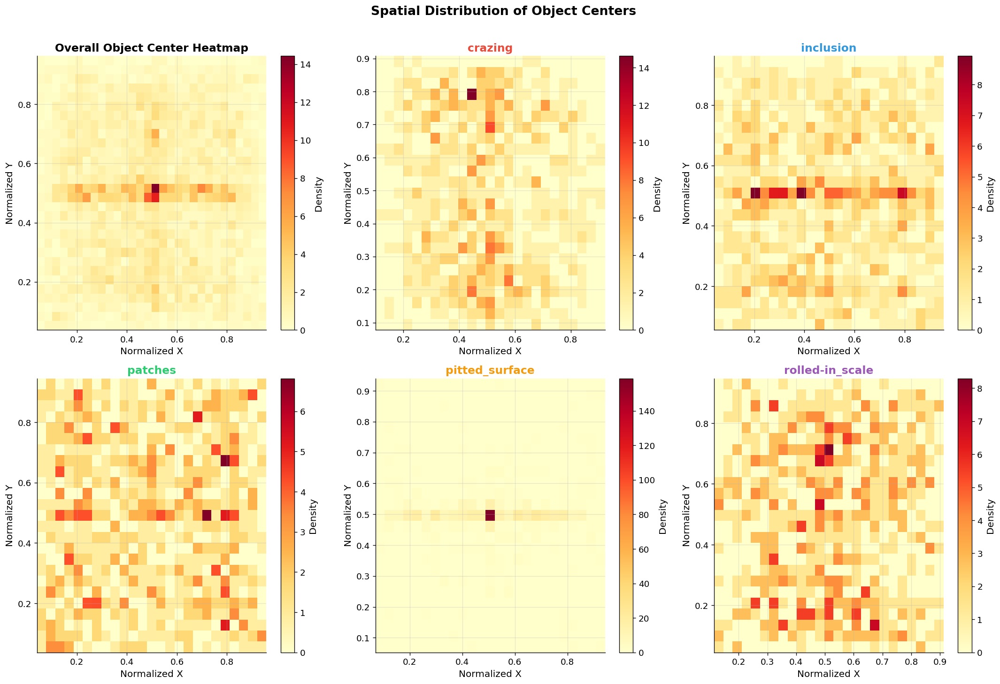

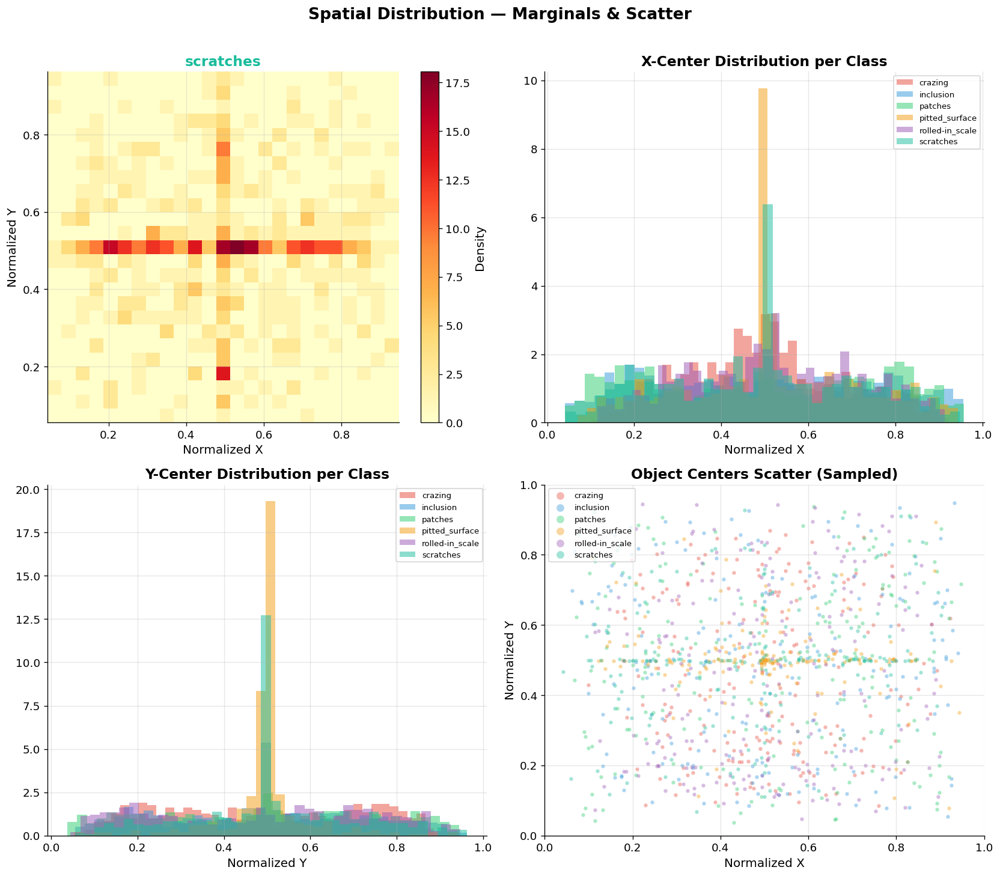

💡 Spatial bias analysis helps determine if center-bias augmentation is needed.


In [10]:
# =============================================================================
# SECTION 9: SPATIAL HEATMAPS — WHERE OBJECTS APPEAR
# =============================================================================

# ── Normalize bbox centers to [0, 1] ─────────────────────────────────────────
df_ann['norm_x'] = df_ann['x_center'] / df_ann['image_width']
df_ann['norm_y'] = df_ann['y_center'] / df_ann['image_height']

# ── Overall spatial heatmap ──────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Overall heatmap
h = axes[0, 0].hist2d(df_ann['norm_x'], df_ann['norm_y'], bins=30, cmap='YlOrRd', density=True)
plt.colorbar(h[3], ax=axes[0, 0], label='Density')
axes[0, 0].set_title('Overall Object Center Heatmap', fontweight='bold')
axes[0, 0].set_xlabel('Normalized X')
axes[0, 0].set_ylabel('Normalized Y')

# Per-class heatmaps (first 5 classes)
for idx, cls in enumerate(CLASS_NAMES[:5]):
    row = (idx + 1) // 3
    col = (idx + 1) % 3
    mask = df_ann['class_name'] == cls
    h = axes[row, col].hist2d(df_ann[mask]['norm_x'], df_ann[mask]['norm_y'], 
                               bins=25, cmap='YlOrRd', density=True)
    plt.colorbar(h[3], ax=axes[row, col], label='Density')
    axes[row, col].set_title(f'{cls}', fontweight='bold', color=CLASS_COLORS[cls])
    axes[row, col].set_xlabel('Normalized X')
    axes[row, col].set_ylabel('Normalized Y')

plt.suptitle('Spatial Distribution of Object Centers', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# ── 6th class + marginal distributions ───────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Last class heatmap
cls = CLASS_NAMES[5]
mask = df_ann['class_name'] == cls
h = axes[0, 0].hist2d(df_ann[mask]['norm_x'], df_ann[mask]['norm_y'], 
                       bins=25, cmap='YlOrRd', density=True)
plt.colorbar(h[3], ax=axes[0, 0], label='Density')
axes[0, 0].set_title(f'{cls}', fontweight='bold', color=CLASS_COLORS[cls])
axes[0, 0].set_xlabel('Normalized X')
axes[0, 0].set_ylabel('Normalized Y')

# Marginal X distribution per class
for cls in CLASS_NAMES:
    mask = df_ann['class_name'] == cls
    axes[0, 1].hist(df_ann[mask]['norm_x'], bins=40, alpha=0.5, label=cls, 
                    color=CLASS_COLORS[cls], density=True)
axes[0, 1].set_title('X-Center Distribution per Class', fontweight='bold')
axes[0, 1].set_xlabel('Normalized X')
axes[0, 1].legend(fontsize=8)

# Marginal Y distribution per class
for cls in CLASS_NAMES:
    mask = df_ann['class_name'] == cls
    axes[1, 0].hist(df_ann[mask]['norm_y'], bins=40, alpha=0.5, label=cls, 
                    color=CLASS_COLORS[cls], density=True)
axes[1, 0].set_title('Y-Center Distribution per Class', fontweight='bold')
axes[1, 0].set_xlabel('Normalized Y')
axes[1, 0].legend(fontsize=8)

# Combined scatter
for cls in CLASS_NAMES:
    mask = df_ann['class_name'] == cls
    sample = df_ann[mask].sample(min(200, mask.sum()), random_state=42)
    axes[1, 1].scatter(sample['norm_x'], sample['norm_y'], c=CLASS_COLORS[cls], 
                       label=cls, alpha=0.4, s=15, edgecolors='white', linewidth=0.2)
axes[1, 1].set_title('Object Centers Scatter (Sampled)', fontweight='bold')
axes[1, 1].set_xlabel('Normalized X')
axes[1, 1].set_ylabel('Normalized Y')
axes[1, 1].legend(fontsize=8, markerscale=2)
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)

plt.suptitle('Spatial Distribution — Marginals & Scatter', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

print("💡 Spatial bias analysis helps determine if center-bias augmentation is needed.")

---
## 10. Object Size Analysis — Relative to 200×200 Images

**Note:** COCO thresholds (32², 96²) are designed for 640×480+ images. For our 200×200 images, we use **relative thresholds** based on image area:
- **Tiny**: <1% of image area (<400 px²)
- **Small**: 1-5% of image area (400-2000 px²)
- **Medium**: 5-15% of image area (2000-6000 px²)
- **Large**: >15% of image area (>6000 px²)

📏 RELATIVE OBJECT SIZE DISTRIBUTION (for 200×200 images)

  Thresholds: tiny <1% | small 1-5% | medium 5-15% | large >15%
  Image area: 40,000 px²

       tiny (<1%):    50  (  1.2%)  
     small (1-5%):   964  ( 23.0%)  ███████████
   medium (5-15%): 1,486  ( 35.5%)  █████████████████
     large (>15%): 1,689  ( 40.3%)  ████████████████████

  💡 Tiny objects (<1% area) are the hardest to detect
     → Need higher input resolution or copy-paste augmentation


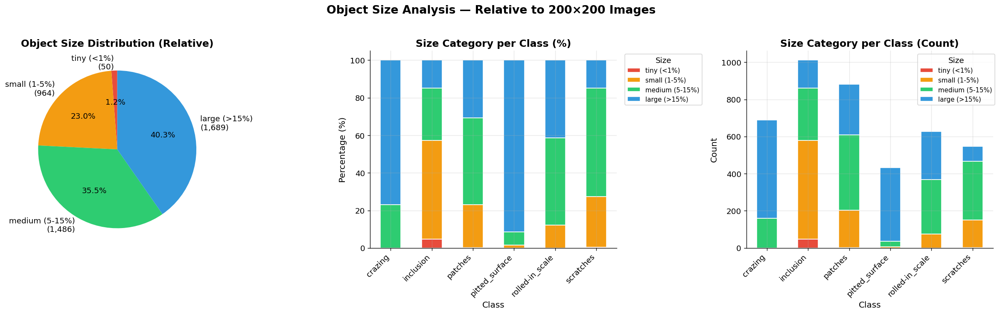


📋 Per-Class Size Distribution:
                 Tiny  Small  Medium  Large  Total  Tiny%  Small%  Medium%  Large%
class_name                                                                        
crazing             0      0     159    530    689    0.0     0.0     23.1    76.9
inclusion          47    531     282    151   1011    4.6    52.5     27.9    14.9
patches             1    202     407    271    881    0.1    22.9     46.2    30.8
pitted_surface      0      7      30    395    432    0.0     1.6      6.9    91.4
rolled-in_scale     0     76     292    260    628    0.0    12.1     46.5    41.4
scratches           2    148     316     82    548    0.4    27.0     57.7    15.0

💡 Classes with high % of tiny objects need special attention:


In [12]:
# =============================================================================
# SECTION 11: OBJECT SIZE ANALYSIS — RELATIVE TO 200×200 IMAGES
# =============================================================================

# Relative thresholds for 200×200 images (40,000 px² total)
# These are more meaningful than COCO absolute thresholds
IMAGE_AREA = 200 * 200  # 40,000 px²

def relative_size_category(area_pct):
    """Classify by relative area percentage."""
    if area_pct < 1:
        return 'tiny (<1%)'
    elif area_pct < 5:
        return 'small (1-5%)'
    elif area_pct < 15:
        return 'medium (5-15%)'
    else:
        return 'large (>15%)'

# Apply relative size classification
df_ann['relative_size'] = df_ann['relative_area'].apply(relative_size_category)

# ── Overall size distribution ────────────────────────────────────────────────
size_dist = df_ann['relative_size'].value_counts()
size_dist = size_dist.reindex(['tiny (<1%)', 'small (1-5%)', 'medium (5-15%)', 'large (>15%)'], fill_value=0)

print("📏 RELATIVE OBJECT SIZE DISTRIBUTION (for 200×200 images)")
print("=" * 70)
print(f"\n  Thresholds: tiny <1% | small 1-5% | medium 5-15% | large >15%")
print(f"  Image area: {IMAGE_AREA:,} px²\n")
for cat in ['tiny (<1%)', 'small (1-5%)', 'medium (5-15%)', 'large (>15%)']:
    cnt = size_dist[cat]
    pct = cnt / len(df_ann) * 100
    bar = '█' * int(pct / 2)
    print(f"  {cat:>15s}: {cnt:>5,}  ({pct:>5.1f}%)  {bar}")

print(f"\n  💡 Tiny objects (<1% area) are the hardest to detect")
print(f"     → Need higher input resolution or copy-paste augmentation")

# ── Per-class size breakdown ─────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Panel 1: Overall pie chart
colors_pie = ['#E74C3C', '#F39C12', '#2ECC71', '#3498DB']
axes[0].pie(size_dist.values, labels=[f"{cat}\n({cnt:,})" for cat, cnt in zip(size_dist.index, size_dist.values)],
            colors=colors_pie, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 11})
axes[0].set_title('Object Size Distribution (Relative)', fontweight='bold', fontsize=14)

# Panel 2: Per-class stacked bar
class_size = df_ann.groupby(['class_name', 'relative_size']).size().unstack(fill_value=0)
class_size = class_size.reindex(index=CLASS_NAMES, columns=['tiny (<1%)', 'small (1-5%)', 'medium (5-15%)', 'large (>15%)'], fill_value=0)
class_size_pct = class_size.div(class_size.sum(axis=1), axis=0) * 100

class_size_pct.plot(kind='bar', stacked=True, ax=axes[1],
                    color=colors_pie, edgecolor='white', linewidth=1)
axes[1].set_title('Size Category per Class (%)', fontweight='bold', fontsize=14)
axes[1].set_xlabel('Class')
axes[1].set_ylabel('Percentage (%)')
axes[1].legend(title='Size', fontsize=9, bbox_to_anchor=(1.02, 1))
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

# Panel 3: Per-class absolute counts
class_size.plot(kind='bar', stacked=True, ax=axes[2],
                color=colors_pie, edgecolor='white', linewidth=1)
axes[2].set_title('Size Category per Class (Count)', fontweight='bold', fontsize=14)
axes[2].set_xlabel('Class')
axes[2].set_ylabel('Count')
axes[2].legend(title='Size', fontsize=9, bbox_to_anchor=(1.02, 1))
axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha='right')

plt.suptitle('Object Size Analysis — Relative to 200×200 Images', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── Size distribution table ──────────────────────────────────────────────────
print("\n📋 Per-Class Size Distribution:")
size_table = pd.DataFrame({
    'Tiny': class_size['tiny (<1%)'],
    'Small': class_size['small (1-5%)'],
    'Medium': class_size['medium (5-15%)'],
    'Large': class_size['large (>15%)'],
    'Total': class_size.sum(axis=1),
    'Tiny%': (class_size['tiny (<1%)'] / class_size.sum(axis=1) * 100).round(1),
    'Small%': (class_size['small (1-5%)'] / class_size.sum(axis=1) * 100).round(1),
    'Medium%': (class_size['medium (5-15%)'] / class_size.sum(axis=1) * 100).round(1),
    'Large%': (class_size['large (>15%)'] / class_size.sum(axis=1) * 100).round(1),
})
print(size_table.to_string())

print(f"\n💡 Classes with high % of tiny objects need special attention:")
tiny_heavy = size_table[size_table['Tiny%'] > 30].index.tolist()
if tiny_heavy:
    print(f"   → {tiny_heavy} have >30% tiny objects")
    print(f"   → Consider: higher input resolution, P2 feature level, copy-paste augmentation")

---
## 11. Class Co-occurrence Matrix

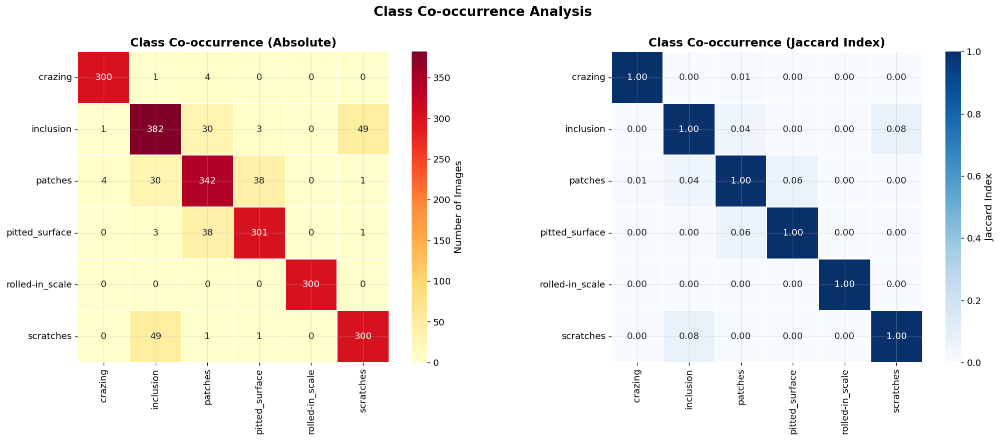

📊 CO-OCCURRENCE SUMMARY
  Total unique images:        1,800
  Single-class images:        1,677
  Multi-class images:         123 (6.8%)

  Most common multi-label pairs:
    inclusion + scratches: 49 images
    patches + pitted_surface: 38 images
    inclusion + patches: 30 images
    crazing + patches: 4 images
    inclusion + pitted_surface: 3 images

💡 Co-occurring classes may cause confusion — monitor per-class AP carefully.


In [13]:
# =============================================================================
# SECTION 12: CLASS CO-OCCURRENCE MATRIX
# =============================================================================

# Build co-occurrence: which classes appear in the same image
img_classes = df_ann.groupby('image_id')['class_name'].apply(set).reset_index()

cooccurrence = pd.DataFrame(0, index=CLASS_NAMES, columns=CLASS_NAMES, dtype=int)

for _, row in img_classes.iterrows():
    classes = row['class_name']
    for c1 in classes:
        for c2 in classes:
            if c1 in CLASS_NAMES and c2 in CLASS_NAMES:
                cooccurrence.loc[c1, c2] += 1

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Heatmap 1: Absolute co-occurrence
sns.heatmap(cooccurrence, annot=True, fmt='d', cmap='YlOrRd', ax=axes[0],
            linewidths=1, linecolor='white', square=True,
            cbar_kws={'label': 'Number of Images'})
axes[0].set_title('Class Co-occurrence (Absolute)', fontweight='bold', fontsize=14)

# Heatmap 2: Normalized (Jaccard-like) — create as float DataFrame
cooccurrence_norm = pd.DataFrame(0.0, index=CLASS_NAMES, columns=CLASS_NAMES)
for i in range(N_CLASSES):
    for j in range(N_CLASSES):
        union = cooccurrence.iloc[i, i] + cooccurrence.iloc[j, j] - cooccurrence.iloc[i, j]
        cooccurrence_norm.iloc[i, j] = cooccurrence.iloc[i, j] / union if union > 0 else 0.0

sns.heatmap(cooccurrence_norm, annot=True, fmt='.2f', cmap='Blues', ax=axes[1],
            linewidths=1, linecolor='white', square=True,
            cbar_kws={'label': 'Jaccard Index'})
axes[1].set_title('Class Co-occurrence (Jaccard Index)', fontweight='bold', fontsize=14)

plt.suptitle('Class Co-occurrence Analysis', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── Multi-label images ───────────────────────────────────────────────────────
img_classes['n_classes'] = img_classes['class_name'].apply(len)
multi_label = img_classes[img_classes['n_classes'] > 1]

print(f"📊 CO-OCCURRENCE SUMMARY")
print(f"{'=' * 60}")
print(f"  Total unique images:        {len(img_classes):,}")
print(f"  Single-class images:        {len(img_classes) - len(multi_label):,}")
print(f"  Multi-class images:         {len(multi_label):,} ({len(multi_label)/len(img_classes)*100:.1f}%)")

if len(multi_label) > 0:
    print(f"\n  Most common multi-label pairs:")
    pair_counts = Counter()
    for _, row in multi_label.iterrows():
        for pair in combinations(sorted(row['class_name']), 2):
            pair_counts[pair] += 1
    for pair, cnt in pair_counts.most_common(5):
        print(f"    {pair[0]} + {pair[1]}: {cnt} images")

print(f"\n💡 Co-occurring classes may cause confusion — monitor per-class AP carefully.")

---
## 12. Edge & Boundary Object Detection

🔲 EDGE & BOUNDARY OBJECT ANALYSIS
  Total annotations:               4,189
  Touching any edge:               2,370 (56.6%)
  Out of bounds:                   0 (0.0%)

  Per-edge breakdown:
    Left edge:     586
    Top edge:    1,118
    Right edge:    567
    Bottom edge:   998

  Per-class edge-touching percentage:
                 crazing:  377 ( 54.7%)  ███████████████████████████
               inclusion:  436 ( 43.1%)  █████████████████████
                 patches:  523 ( 59.4%)  █████████████████████████████
          pitted_surface:  361 ( 83.6%)  █████████████████████████████████████████
         rolled-in_scale:  242 ( 38.5%)  ███████████████████
               scratches:  431 ( 78.6%)  ███████████████████████████████████████


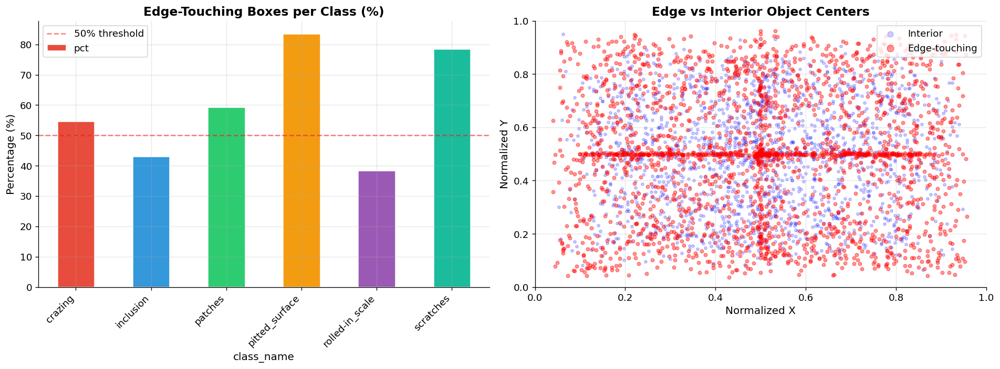


💡 High edge-touching % suggests defects often span image boundaries.
   → Consider: mosaic augmentation, copy-paste, or padding strategies


In [14]:
# =============================================================================
# SECTION 13: EDGE & BOUNDARY OBJECT DETECTION
# =============================================================================

# Detect boxes touching or exceeding image boundaries
EDGE_MARGIN = 2  # pixels tolerance

df_ann['touches_left'] = df_ann['x1'] <= EDGE_MARGIN
df_ann['touches_top'] = df_ann['y1'] <= EDGE_MARGIN
df_ann['touches_right'] = df_ann['x2'] >= (df_ann['image_width'] - EDGE_MARGIN)
df_ann['touches_bottom'] = df_ann['y2'] >= (df_ann['image_height'] - EDGE_MARGIN)
df_ann['touches_any_edge'] = (df_ann['touches_left'] | df_ann['touches_top'] | 
                                df_ann['touches_right'] | df_ann['touches_bottom'])

# Out-of-bounds detection
df_ann['out_of_bounds'] = ((df_ann['x1'] < 0) | (df_ann['y1'] < 0) | 
                            (df_ann['x2'] > df_ann['image_width']) | 
                            (df_ann['y2'] > df_ann['image_height']))

edge_anns = df_ann[df_ann['touches_any_edge']]
oob_anns = df_ann[df_ann['out_of_bounds']]

print("🔲 EDGE & BOUNDARY OBJECT ANALYSIS")
print("=" * 60)
print(f"  Total annotations:               {len(df_ann):,}")
print(f"  Touching any edge:               {len(edge_anns):,} ({len(edge_anns)/len(df_ann)*100:.1f}%)")
print(f"  Out of bounds:                   {len(oob_anns):,} ({len(oob_anns)/len(df_ann)*100:.1f}%)")

# Per-edge breakdown
print(f"\n  Per-edge breakdown:")
print(f"    Left edge:   {df_ann['touches_left'].sum():>5,}")
print(f"    Top edge:    {df_ann['touches_top'].sum():>5,}")
print(f"    Right edge:  {df_ann['touches_right'].sum():>5,}")
print(f"    Bottom edge: {df_ann['touches_bottom'].sum():>5,}")

# ── Per-class edge statistics ────────────────────────────────────────────────
edge_by_class = df_ann.groupby('class_name')['touches_any_edge'].agg(['sum', 'count'])
edge_by_class['pct'] = (edge_by_class['sum'] / edge_by_class['count'] * 100).round(1)
edge_by_class = edge_by_class.reindex(CLASS_NAMES)

print(f"\n  Per-class edge-touching percentage:")
for cls in CLASS_NAMES:
    pct = edge_by_class.loc[cls, 'pct']
    cnt = edge_by_class.loc[cls, 'sum']
    bar = '█' * int(pct / 2)
    print(f"    {cls:>20s}: {cnt:>4,} ({pct:>5.1f}%)  {bar}")

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar chart: edge touching per class
edge_by_class['pct'].plot(kind='bar', ax=axes[0], 
                          color=[CLASS_COLORS[c] for c in CLASS_NAMES],
                          edgecolor='white', linewidth=1.5)
axes[0].set_title('Edge-Touching Boxes per Class (%)', fontweight='bold')
axes[0].set_ylabel('Percentage (%)')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
axes[0].axhline(50, color='red', linestyle='--', alpha=0.5, label='50% threshold')
axes[0].legend()

# Box center distribution near edges
edge_mask = df_ann['touches_any_edge']
axes[1].scatter(df_ann[~edge_mask]['norm_x'], df_ann[~edge_mask]['norm_y'],
               c='blue', alpha=0.2, s=10, label='Interior')
axes[1].scatter(df_ann[edge_mask]['norm_x'], df_ann[edge_mask]['norm_y'],
               c='red', alpha=0.4, s=15, label='Edge-touching')
axes[1].set_title('Edge vs Interior Object Centers', fontweight='bold')
axes[1].set_xlabel('Normalized X')
axes[1].set_ylabel('Normalized Y')
axes[1].legend(markerscale=2)
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)

plt.tight_layout()
plt.show()

print(f"\n💡 High edge-touching % suggests defects often span image boundaries.")
print(f"   → Consider: mosaic augmentation, copy-paste, or padding strategies")

---
## 13. Image Quality Analysis — Brightness, Contrast, Blur

🔍 Computing image quality metrics (brightness, contrast, blur)...
   This may take a moment...



  Analyzing: 100%|████████████████████████| 1800/1800 [00:01<00:00, 1661.05it/s]



📊 IMAGE QUALITY STATISTICS
       brightness  contrast  blur_score
count     1800.00   1800.00     1800.00
mean       128.28     26.79      773.26
std         44.54     15.45      831.46
min         34.34      5.97        8.78
25%         93.36     14.94       70.31
50%        125.85     23.44      419.88
75%        156.10     32.42     1403.99
max        246.11     74.21     2850.19

⚠️  POTENTIALLY PROBLEMATIC IMAGES:
  Very dark (brightness < 30):         0 (0.0%)
  Very bright (brightness > 225):      53 (2.9%)
  Very blurry (bottom 5%):            90 (5.0%)


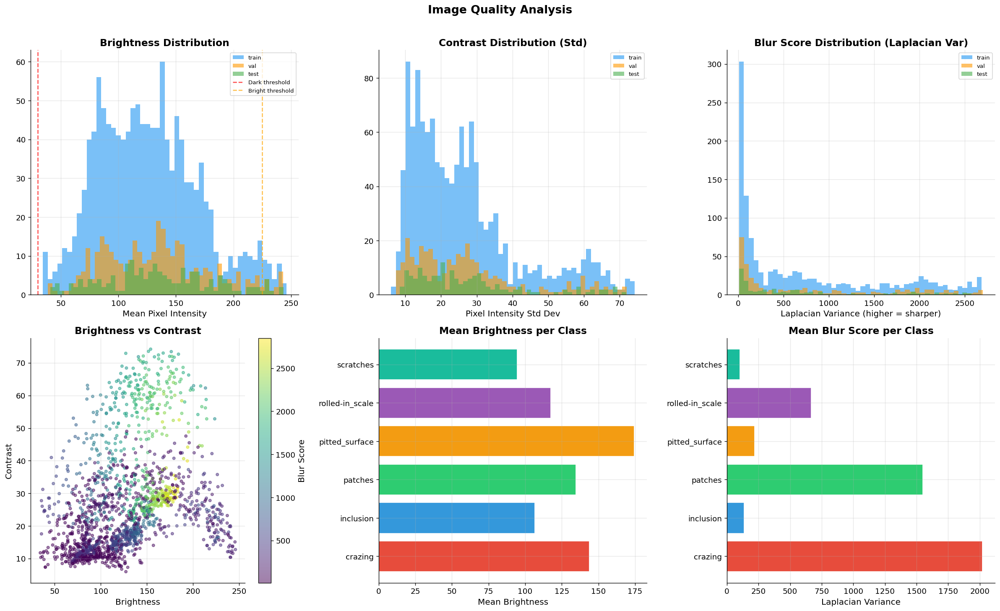

In [15]:
# =============================================================================
# SECTION 14: IMAGE QUALITY ANALYSIS
# =============================================================================

print("🔍 Computing image quality metrics (brightness, contrast, blur)...")
print("   This may take a moment...\n")

# Compute quality metrics for all images
quality_data = []
for _, row in tqdm(df_img.iterrows(), total=len(df_img), desc="  Analyzing", ncols=80):
    img_path = row['image_path']
    brightness, contrast = get_image_brightness(img_path)
    blur = get_blur_score(img_path)
    
    quality_data.append({
        'image_id': row['image_id'],
        'split': row['split'],
        'brightness': brightness,
        'contrast': contrast,
        'blur_score': blur,
        'file_size_kb': row['file_size_kb'],
    })

df_quality = pd.DataFrame(quality_data)

# ── Quality statistics ───────────────────────────────────────────────────────
print("\n📊 IMAGE QUALITY STATISTICS")
print("=" * 70)
print(df_quality[['brightness', 'contrast', 'blur_score']].describe().round(2).to_string())

# Flag problematic images
dark_imgs = df_quality[df_quality['brightness'] < 30]
bright_imgs = df_quality[df_quality['brightness'] > 225]
blurry_imgs = df_quality[df_quality['blur_score'] < df_quality['blur_score'].quantile(0.05)]

print(f"\n⚠️  POTENTIALLY PROBLEMATIC IMAGES:")
print(f"  Very dark (brightness < 30):      {len(dark_imgs):>4,} ({len(dark_imgs)/len(df_quality)*100:.1f}%)")
print(f"  Very bright (brightness > 225):    {len(bright_imgs):>4,} ({len(bright_imgs)/len(df_quality)*100:.1f}%)")
print(f"  Very blurry (bottom 5%):          {len(blurry_imgs):>4,} ({len(blurry_imgs)/len(df_quality)*100:.1f}%)")

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# Brightness distribution
for split in ['train', 'val', 'test']:
    mask = df_quality['split'] == split
    axes[0, 0].hist(df_quality[mask]['brightness'].dropna(), bins=50, alpha=0.6, 
                    label=split, color=SPLIT_COLORS[split])
axes[0, 0].axvline(30, color='red', linestyle='--', alpha=0.7, label='Dark threshold')
axes[0, 0].axvline(225, color='orange', linestyle='--', alpha=0.7, label='Bright threshold')
axes[0, 0].set_title('Brightness Distribution', fontweight='bold')
axes[0, 0].set_xlabel('Mean Pixel Intensity')
axes[0, 0].legend(fontsize=8)

# Contrast distribution
for split in ['train', 'val', 'test']:
    mask = df_quality['split'] == split
    axes[0, 1].hist(df_quality[mask]['contrast'].dropna(), bins=50, alpha=0.6, 
                    label=split, color=SPLIT_COLORS[split])
axes[0, 1].set_title('Contrast Distribution (Std)', fontweight='bold')
axes[0, 1].set_xlabel('Pixel Intensity Std Dev')
axes[0, 1].legend(fontsize=8)

# Blur score distribution
for split in ['train', 'val', 'test']:
    mask = df_quality['split'] == split
    data = df_quality[mask]['blur_score'].dropna()
    axes[0, 2].hist(data.clip(0, data.quantile(0.99)), bins=50, alpha=0.6, 
                    label=split, color=SPLIT_COLORS[split])
axes[0, 2].set_title('Blur Score Distribution (Laplacian Var)', fontweight='bold')
axes[0, 2].set_xlabel('Laplacian Variance (higher = sharper)')
axes[0, 2].legend(fontsize=8)

# Brightness vs Contrast scatter
scatter = axes[1, 0].scatter(df_quality['brightness'], df_quality['contrast'], 
                              c=df_quality['blur_score'], cmap='viridis', 
                              alpha=0.5, s=15)
plt.colorbar(scatter, ax=axes[1, 0], label='Blur Score')
axes[1, 0].set_title('Brightness vs Contrast', fontweight='bold')
axes[1, 0].set_xlabel('Brightness')
axes[1, 0].set_ylabel('Contrast')

# Quality by class (merge with annotations)
df_ann_quality = df_ann.merge(df_quality[['image_id', 'brightness', 'contrast', 'blur_score']], 
                               on='image_id', how='left')
quality_by_class = df_ann_quality.groupby('class_name')[['brightness', 'contrast', 'blur_score']].mean()
quality_by_class = quality_by_class.reindex(CLASS_NAMES)

# Brightness by class
axes[1, 1].barh(quality_by_class.index, quality_by_class['brightness'],
                color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white')
axes[1, 1].set_title('Mean Brightness per Class', fontweight='bold')
axes[1, 1].set_xlabel('Mean Brightness')

# Blur by class
axes[1, 2].barh(quality_by_class.index, quality_by_class['blur_score'],
                color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white')
axes[1, 2].set_title('Mean Blur Score per Class', fontweight='bold')
axes[1, 2].set_xlabel('Laplacian Variance')

plt.suptitle('Image Quality Analysis', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

---
## 14. CLAHE Preprocessing Comparison — Raw vs CLAHE vs CLAHE4

📊 CLAHE VARIANT COMPARISON (train split, 200 sample images)

  RAW:
    Brightness: mean=141.0  std=29.0
    Contrast:   mean=28.9  std=4.7
    Blur Score: mean=1972.7

  CLAHE:
    Brightness: mean=133.1  std=13.8
    Contrast:   mean=41.9  std=4.2
    Blur Score: mean=7392.6

  CLAHE4:
    Brightness: mean=130.8  std=6.7
    Contrast:   mean=58.7  std=4.6
    Blur Score: mean=16388.1


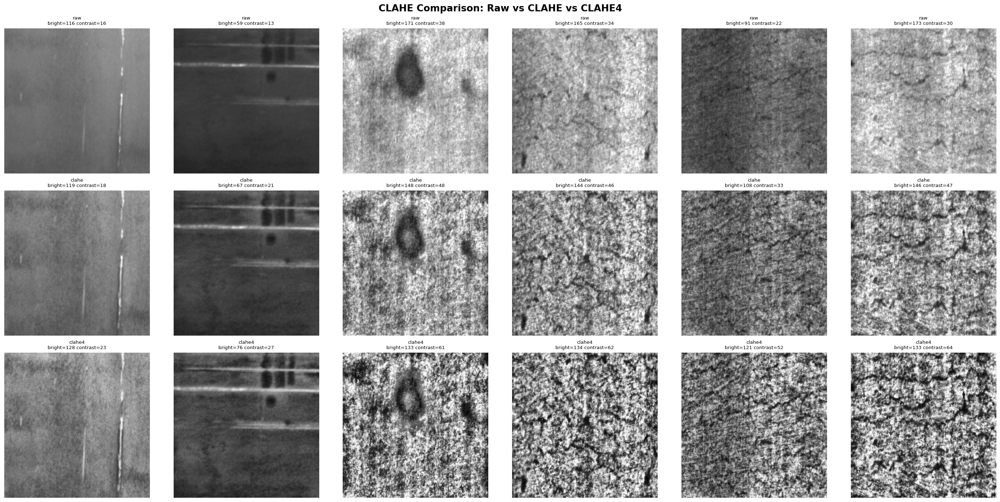


💡 CLAHE enhances local contrast — may help low-contrast defects like crazing
   Check: does CLAHE make crazing more visible? Does it hurt other classes?


In [16]:
# =============================================================================
# SECTION 16: CLAHE PREPROCESSING COMPARISON
# =============================================================================

# ── Load CLAHE variants ──────────────────────────────────────────────────────
clahe_variants = {
    'raw': DATASET_ROOT,
    'clahe': PROJECT_ROOT / 'datasets' / 'NEU-DET' / 'yolo_clahe',
    'clahe4': PROJECT_ROOT / 'datasets' / 'NEU-DET' / 'yolo_clahe4',
}

# Compare brightness/contrast across variants
variant_stats = {}
for variant_name, variant_path in clahe_variants.items():
    if not variant_path.exists():
        print(f"  ⚠️ {variant_name} not found at {variant_path}")
        continue
    
    stats_list = []
    img_dir = variant_path / 'images' / 'train'
    if not img_dir.exists():
        continue
    
    for img_path in sorted(img_dir.iterdir())[:200]:  # Sample 200 images
        if img_path.suffix.lower() not in ('.jpg', '.png'):
            continue
        img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        stats_list.append({
            'brightness': float(np.mean(img)),
            'contrast': float(np.std(img)),
            'blur_score': float(cv2.Laplacian(img, cv2.CV_64F).var()),
        })
    
    variant_stats[variant_name] = pd.DataFrame(stats_list)

# ── Print comparison ─────────────────────────────────────────────────────────
print("📊 CLAHE VARIANT COMPARISON (train split, 200 sample images)")
print("=" * 70)
for name, df_v in variant_stats.items():
    print(f"\n  {name.upper()}:")
    print(f"    Brightness: mean={df_v['brightness'].mean():.1f}  std={df_v['brightness'].std():.1f}")
    print(f"    Contrast:   mean={df_v['contrast'].mean():.1f}  std={df_v['contrast'].std():.1f}")
    print(f"    Blur Score: mean={df_v['blur_score'].mean():.1f}")

# ── Visual comparison ────────────────────────────────────────────────────────
# Pick a few sample images and show raw vs clahe vs clahe4
sample_ids_clahe = np.random.choice(
    df_img[df_img['split'] == 'train']['image_id'].values, size=6, replace=False
)

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('CLAHE Comparison: Raw vs CLAHE vs CLAHE4', fontsize=16, fontweight='bold')

for col, img_id in enumerate(sample_ids_clahe):
    for row, (variant_name, variant_path) in enumerate(clahe_variants.items()):
        img_path = variant_path / 'images' / 'train' / f"{img_id}.jpg"
        if not img_path.exists():
            # Try .png
            img_path = variant_path / 'images' / 'train' / f"{img_id}.png"
        
        ax = axes[row, col]
        if img_path.exists():
            img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
            if img is not None:
                ax.imshow(img, cmap='gray', vmin=0, vmax=255)
                ax.set_title(f"{variant_name}\nbright={np.mean(img):.0f} contrast={np.std(img):.0f}", fontsize=8)
        ax.axis('off')
    
    # Add row labels
    axes[0, col].set_ylabel('RAW', fontsize=12, fontweight='bold') if col == 0 else None
    axes[1, col].set_ylabel('CLAHE', fontsize=12, fontweight='bold') if col == 0 else None
    axes[2, col].set_ylabel('CLAHE4', fontsize=12, fontweight='bold') if col == 0 else None

plt.tight_layout()
plt.show()

print("\n💡 CLAHE enhances local contrast — may help low-contrast defects like crazing")
print("   Check: does CLAHE make crazing more visible? Does it hurt other classes?")

---
## 17. Class Imbalance Deep Dive — Effective Samples & Weights

⚖️ CLASS WEIGHT ANALYSIS
          Class  Count  Proportion%  Inv Freq Weight  Effective Num (β=0.9999)  Effective Weight
        crazing    689        16.45           0.9356                     665.8            0.9376
      inclusion   1011        24.13           0.6376                     961.6            0.6492
        patches    881        21.03           0.7317                     843.3            0.7403
 pitted_surface    432        10.31           1.4922                     422.8            1.4765
rolled-in_scale    628        14.99           1.0265                     608.7            1.0256
      scratches    548        13.08           1.1763                     533.3            1.1707


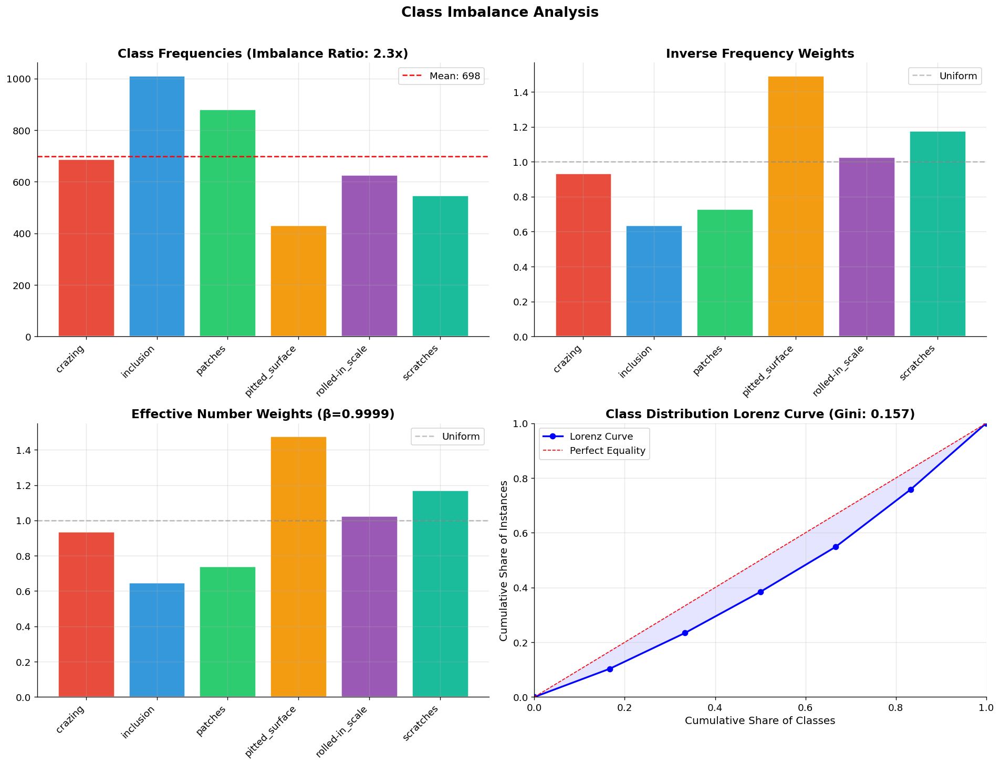


📊 Imbalance Metrics:
   Imbalance Ratio:     2.34x
   Gini Coefficient:    0.157 (0=equal, 1=max imbalance)
   Std/Mean (CV):       0.307

💡 Recommendations:
   → Use weighted loss (CIoU/WIoU) with inverse-frequency weights
   → Consider class-aware sampling or oversampling minority classes
   → Copy-paste augmentation for underrepresented classes


In [19]:
# =============================================================================
# SECTION 17: CLASS IMBALANCE DEEP DIVE
# =============================================================================

# ── Effective number of samples (Cui et al., 2019) ──────────────────────────
BETA = 0.9999  # Smoothing parameter

class_freq = df_ann['class_name'].value_counts().reindex(CLASS_NAMES)
effective_num = (1 - BETA ** class_freq) / (1 - BETA)
inv_effective = 1.0 / effective_num
weights_effective = inv_effective / inv_effective.sum() * N_CLASSES

# Inverse frequency weights
inv_freq = 1.0 / class_freq
weights_inv = inv_freq / inv_freq.sum() * N_CLASSES

# ── Weight table ─────────────────────────────────────────────────────────────
weight_df = pd.DataFrame({
    'Class': CLASS_NAMES,
    'Count': class_freq.values,
    'Proportion%': (class_freq / class_freq.sum() * 100).values.round(2),
    'Inv Freq Weight': weights_inv.values.round(4),
    f'Effective Num (β={BETA})': effective_num.values.round(1),
    'Effective Weight': weights_effective.values.round(4),
})

print("⚖️ CLASS WEIGHT ANALYSIS")
print("=" * 80)
print(weight_df.to_string(index=False))

# ── Visualization ────────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Panel 1: Class frequencies with imbalance ratio
axes[0, 0].bar(range(N_CLASSES), class_freq.values, 
               color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white', linewidth=1.5)
axes[0, 0].axhline(class_freq.mean(), color='red', linestyle='--', label=f'Mean: {class_freq.mean():.0f}')
axes[0, 0].set_title(f'Class Frequencies (Imbalance Ratio: {class_freq.max()/class_freq.min():.1f}x)', fontweight='bold')
axes[0, 0].set_xticks(range(N_CLASSES))
axes[0, 0].set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
axes[0, 0].legend()

# Panel 2: Inverse frequency weights
axes[0, 1].bar(range(N_CLASSES), weights_inv.values, 
               color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white', linewidth=1.5)
axes[0, 1].set_title('Inverse Frequency Weights', fontweight='bold')
axes[0, 1].set_xticks(range(N_CLASSES))
axes[0, 1].set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
axes[0, 1].axhline(1.0, color='gray', linestyle='--', alpha=0.5, label='Uniform')
axes[0, 1].legend()

# Panel 3: Effective number weights
axes[1, 0].bar(range(N_CLASSES), weights_effective.values, 
               color=[CLASS_COLORS[c] for c in CLASS_NAMES], edgecolor='white', linewidth=1.5)
axes[1, 0].set_title(f'Effective Number Weights (β={BETA})', fontweight='bold')
axes[1, 0].set_xticks(range(N_CLASSES))
axes[1, 0].set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
axes[1, 0].axhline(1.0, color='gray', linestyle='--', alpha=0.5, label='Uniform')
axes[1, 0].legend()

# Panel 4: Lorenz curve (cumulative distribution)
sorted_freq = np.sort(class_freq.values)
cumsum = np.cumsum(sorted_freq) / sorted_freq.sum()
lorenz = np.concatenate([[0], cumsum])
x_lorenz = np.linspace(0, 1, len(lorenz))

axes[1, 1].plot(x_lorenz, lorenz, 'b-o', linewidth=2, label='Lorenz Curve')
axes[1, 1].plot([0, 1], [0, 1], 'r--', linewidth=1, label='Perfect Equality')
axes[1, 1].fill_between(x_lorenz, x_lorenz, lorenz, alpha=0.1, color='blue')

# Gini coefficient — np.trapezoid (NumPy 2.x) with fallback to np.trapz
_trapz = getattr(np, 'trapezoid', None) or getattr(np, 'trapz')
gini = 1 - 2 * _trapz(lorenz, x_lorenz)
axes[1, 1].set_title(f'Class Distribution Lorenz Curve (Gini: {gini:.3f})', fontweight='bold')
axes[1, 1].set_xlabel('Cumulative Share of Classes')
axes[1, 1].set_ylabel('Cumulative Share of Instances')
axes[1, 1].legend()
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)

plt.suptitle('Class Imbalance Analysis', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

print(f"\n📊 Imbalance Metrics:")
print(f"   Imbalance Ratio:     {class_freq.max()/class_freq.min():.2f}x")
print(f"   Gini Coefficient:    {gini:.3f} (0=equal, 1=max imbalance)")
print(f"   Std/Mean (CV):       {class_freq.std()/class_freq.mean():.3f}")

print(f"\n💡 Recommendations:")
print(f"   → Use weighted loss (CIoU/WIoU) with inverse-frequency weights")
print(f"   → Consider class-aware sampling or oversampling minority classes")
print(f"   → Copy-paste augmentation for underrepresented classes")

---
## 18. Train/Val/Test Split Quality Analysis

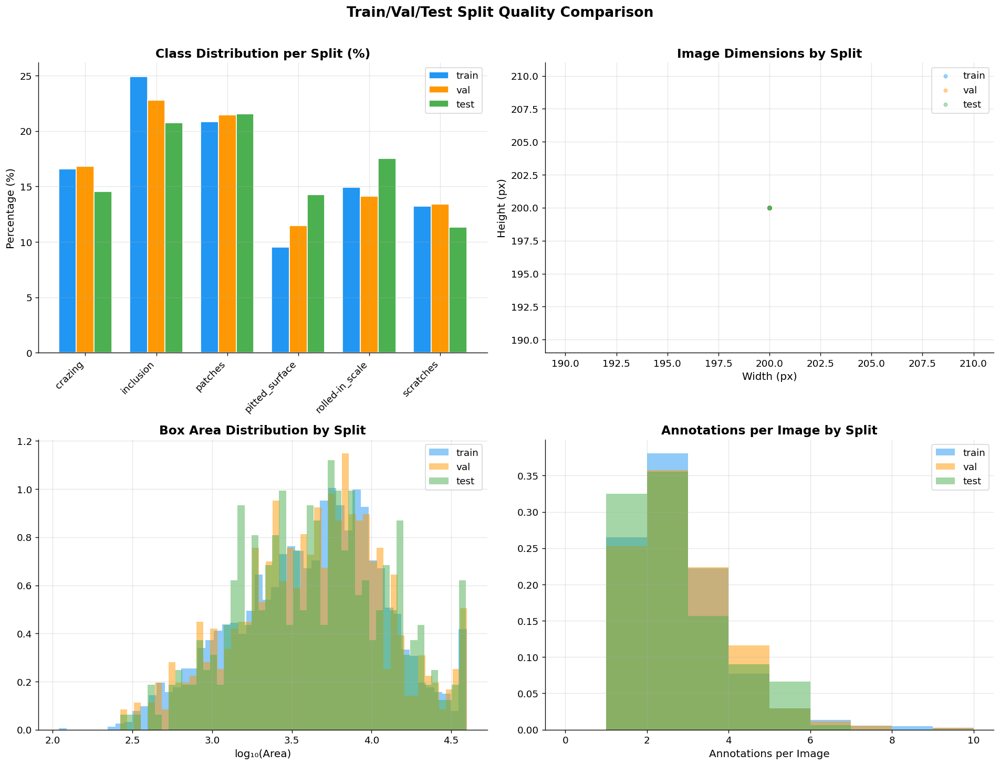

📊 SPLIT COMPARISON TABLE
Split  Images  Annotations Ann/Img Mean Brightness Mean Blur Small Obj%  Classes
TRAIN    1290         2997    2.32           125.9     769.4      11.0%        6
  VAL     344          821    2.39           133.6     800.3      10.5%        6
 TEST     166          371    2.23           135.4     747.1       8.6%        6

📊 STRATIFICATION QUALITY CHECK:
  Train vs VAL: Max class distribution difference = 2.15%
    ✅ Good stratification
  Train vs TEST: Max class distribution difference = 4.78%
    ✅ Good stratification

💡 The split appears well-stratified.


In [22]:
# =============================================================================
# SECTION 18: TRAIN/VAL/TEST SPLIT QUALITY ANALYSIS
# =============================================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Panel 1: Class distribution comparison across splits
split_class = df_ann.groupby(['split', 'class_name']).size().unstack(fill_value=0)
split_class_norm = split_class.div(split_class.sum(axis=1), axis=0) * 100
split_class_norm = split_class_norm.reindex(columns=CLASS_NAMES)

x = np.arange(N_CLASSES)
width = 0.25
for i, split in enumerate(['train', 'val', 'test']):
    axes[0, 0].bar(x + i * width, split_class_norm.loc[split].values, width, 
                   label=split, color=SPLIT_COLORS[split], edgecolor='white')
axes[0, 0].set_title('Class Distribution per Split (%)', fontweight='bold')
axes[0, 0].set_xticks(x + width)
axes[0, 0].set_xticklabels(CLASS_NAMES, rotation=45, ha='right')
axes[0, 0].set_ylabel('Percentage (%)')
axes[0, 0].legend()

# Panel 2: Image dimension distributions per split
for split in ['train', 'val', 'test']:
    mask = df_img['split'] == split
    axes[0, 1].scatter(df_img[mask]['image_width'], df_img[mask]['image_height'],
                       c=SPLIT_COLORS[split], label=split, alpha=0.4, s=15)
axes[0, 1].set_title('Image Dimensions by Split', fontweight='bold')
axes[0, 1].set_xlabel('Width (px)')
axes[0, 1].set_ylabel('Height (px)')
axes[0, 1].legend()

# Panel 3: Box area distributions per split
for split in ['train', 'val', 'test']:
    mask = df_ann['split'] == split
    data = np.log10(df_ann[mask]['bbox_area'] + 1)
    axes[1, 0].hist(data, bins=50, alpha=0.5, label=split, color=SPLIT_COLORS[split], density=True)
axes[1, 0].set_title('Box Area Distribution by Split', fontweight='bold')
axes[1, 0].set_xlabel('log₁₀(Area)')
axes[1, 0].legend()

# Panel 4: Annotations per image per split
for split in ['train', 'val', 'test']:
    mask = df_ann['split'] == split
    ann_per_img = df_ann[mask].groupby('image_id').size()
    axes[1, 1].hist(ann_per_img, bins=range(0, ann_per_img.max() + 2), alpha=0.5, 
                    label=split, color=SPLIT_COLORS[split], density=True)
axes[1, 1].set_title('Annotations per Image by Split', fontweight='bold')
axes[1, 1].set_xlabel('Annotations per Image')
axes[1, 1].legend()

plt.suptitle('Train/Val/Test Split Quality Comparison', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# ── Split comparison table ───────────────────────────────────────────────────
print("📊 SPLIT COMPARISON TABLE")
print("=" * 80)
comparison = []
for split in ['train', 'val', 'test']:
    df_s_img = df_img[df_img['split'] == split]
    df_s_ann = df_ann[df_ann['split'] == split]
    comparison.append({
        'Split': split.upper(),
        'Images': len(df_s_img),
        'Annotations': len(df_s_ann),
        'Ann/Img': f"{len(df_s_ann)/len(df_s_img):.2f}",
        'Mean Brightness': f"{df_quality[df_quality['split']==split]['brightness'].mean():.1f}",
        'Mean Blur': f"{df_quality[df_quality['split']==split]['blur_score'].mean():.1f}",
        'Small Obj%': f"{(df_s_ann['size_category']=='small').mean()*100:.1f}%",
        'Classes': df_s_ann['class_id'].nunique(),
    })

print(pd.DataFrame(comparison).to_string(index=False))

# ── Stratification quality ───────────────────────────────────────────────────
print(f"\n📊 STRATIFICATION QUALITY CHECK:")
print(f"{'=' * 60}")
train_dist = split_class_norm.loc['train']
for split in ['val', 'test']:
    split_dist = split_class_norm.loc[split]
    max_diff = (train_dist - split_dist).abs().max()
    print(f"  Train vs {split.upper()}: Max class distribution difference = {max_diff:.2f}%")
    if max_diff > 5:
        print(f"    ⚠️  >5% difference detected — may need re-stratification")
    else:
        print(f"    ✅ Good stratification")

print(f"\n💡 The split appears {'well-stratified' if max_diff < 5 else 'to need improvement'}.")

---
## 19. Sample Visualization Gallery — Per-Class Examples

📸 PER-CLASS SAMPLE GALLERY


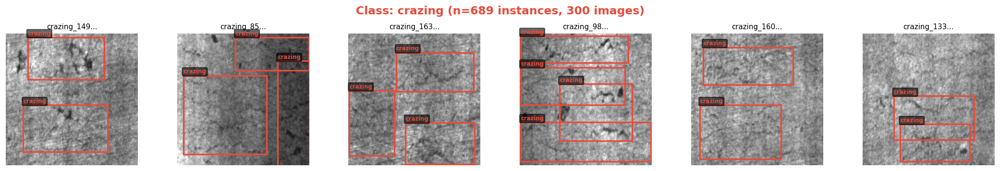

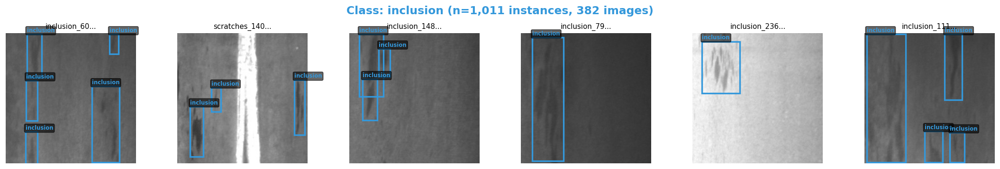

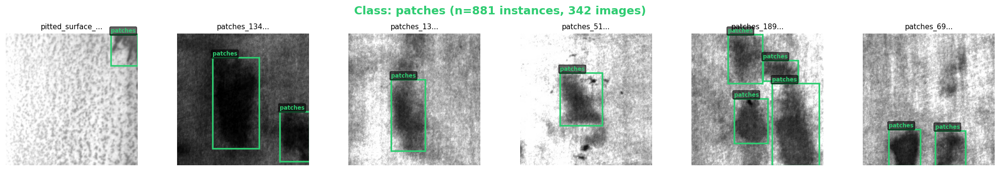

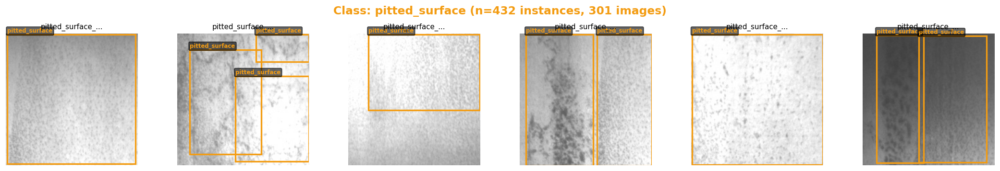

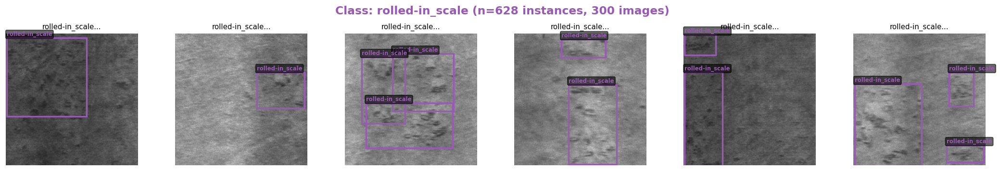

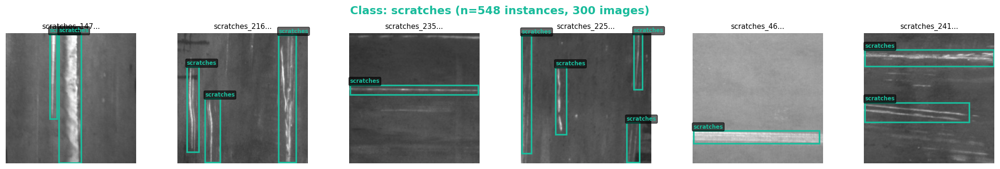


📸 DENSEST SCENE SAMPLES (Most annotations per image)


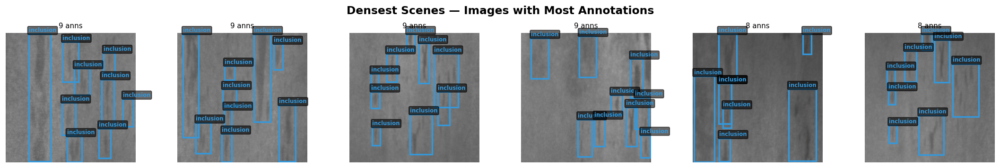


📸 SPARSEST SCENE SAMPLES (Fewest annotations per image)


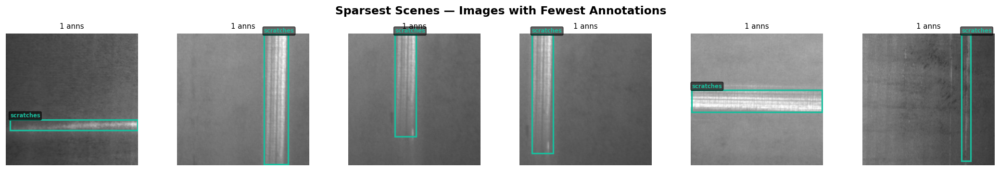

In [23]:
# =============================================================================
# SECTION 19: SAMPLE VISUALIZATION GALLERY
# =============================================================================

def draw_bboxes_on_image(ax, img_path, annotations, title=''):
    """Draw bounding boxes on an image."""
    img = cv2.imread(str(img_path))
    if img is None:
        ax.text(0.5, 0.5, 'Image not found', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(title)
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
    
    for _, ann in annotations.iterrows():
        cls = ann['class_name']
        color = CLASS_COLORS.get(cls, '#FFFFFF')
        rect = patches.Rectangle((ann['x1'], ann['y1']), ann['bbox_w'], ann['bbox_h'],
                                  linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(ann['x1'], ann['y1'] - 3, f"{cls}", color=color, fontsize=7,
                fontweight='bold', bbox=dict(boxstyle='round,pad=0.2', facecolor='black', alpha=0.6))
    
    ax.set_title(title, fontsize=9)
    ax.axis('off')


# ── Per-class samples (2 rows × 6 classes = 12 samples per class) ───────────
print("📸 PER-CLASS SAMPLE GALLERY")
print("=" * 60)

for cls in CLASS_NAMES:
    cls_anns = df_ann[df_ann['class_name'] == cls]
    cls_imgs = cls_anns['image_id'].unique()
    sample_imgs = np.random.choice(cls_imgs, size=min(6, len(cls_imgs)), replace=False)
    
    fig, axes = plt.subplots(1, 6, figsize=(18, 3))
    fig.suptitle(f'Class: {cls} (n={len(cls_anns):,} instances, {len(cls_imgs):,} images)', 
                fontsize=14, fontweight='bold', color=CLASS_COLORS[cls])
    
    for idx, img_id in enumerate(sample_imgs):
        img_path = cls_anns[cls_anns['image_id'] == img_id]['image_path'].iloc[0]
        img_anns = cls_anns[cls_anns['image_id'] == img_id]
        draw_bboxes_on_image(axes[idx], img_path, img_anns, 
                           title=f'{img_id[:15]}...')
    
    plt.tight_layout()
    plt.show()

# ── Dense scenes (most annotations) ─────────────────────────────────────────
print("\n📸 DENSEST SCENE SAMPLES (Most annotations per image)")
print("=" * 60)

ann_counts = df_ann.groupby('image_id').size().sort_values(ascending=False)
dense_imgs = ann_counts.head(6).index

fig, axes = plt.subplots(1, 6, figsize=(18, 3))
fig.suptitle('Densest Scenes — Images with Most Annotations', fontsize=14, fontweight='bold')

for idx, img_id in enumerate(dense_imgs):
    img_path = df_ann[df_ann['image_id'] == img_id]['image_path'].iloc[0]
    img_anns = df_ann[df_ann['image_id'] == img_id]
    draw_bboxes_on_image(axes[idx], img_path, img_anns, 
                       title=f'{ann_counts[img_id]} anns')

plt.tight_layout()
plt.show()

# ── Sparse scenes (fewest annotations) ───────────────────────────────────────
print("\n📸 SPARSEST SCENE SAMPLES (Fewest annotations per image)")
print("=" * 60)

sparse_imgs = ann_counts.tail(6).index

fig, axes = plt.subplots(1, 6, figsize=(18, 3))
fig.suptitle('Sparsest Scenes — Images with Fewest Annotations', fontsize=14, fontweight='bold')

for idx, img_id in enumerate(sparse_imgs):
    img_path = df_ann[df_ann['image_id'] == img_id]['image_path'].iloc[0]
    img_anns = df_ann[df_ann['image_id'] == img_id]
    draw_bboxes_on_image(axes[idx], img_path, img_anns, 
                       title=f'{ann_counts[img_id]} anns')

plt.tight_layout()
plt.show()

---
## 20. Data Augmentation Preview

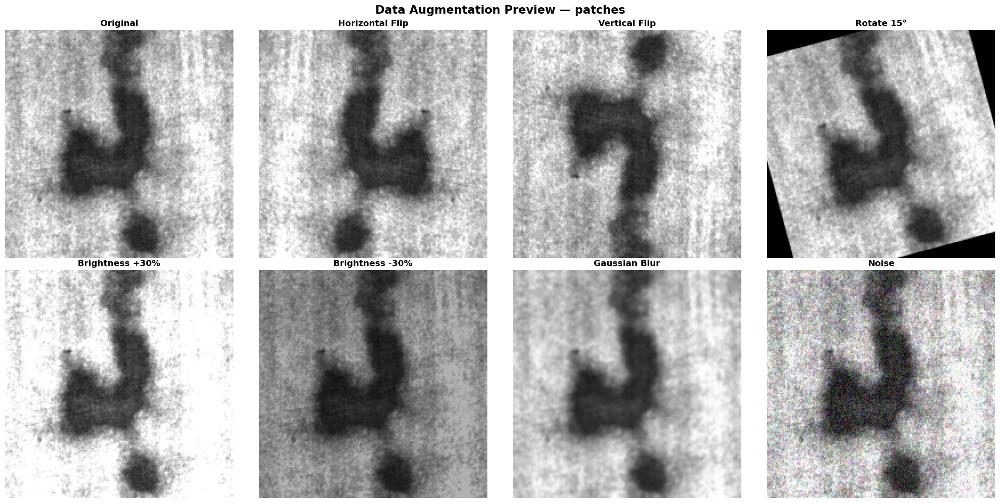


📋 RECOMMENDED YOLOv11 AUGMENTATION PARAMETERS

Based on dataset characteristics (200×200 grayscale, 6 classes, steel defects):

┌─────────────────────────┬───────────┬─────────────────────────────────────┐
│ Parameter               │ Value     │ Rationale                           │
├─────────────────────────┼───────────┼─────────────────────────────────────┤
│ hsv_h (Hue)             │ 0.0       │ Grayscale images — no hue           │
│ hsv_s (Saturation)      │ 0.0       │ Grayscale images — no saturation    │
│ hsv_v (Value/Brightness)│ 0.4       │ Moderate brightness augmentation    │
│ degrees (Rotation)      │ 10.0      │ Small rotation (defects have orien) │
│ translate               │ 0.1       │ Small shift                         │
│ scale                   │ 0.5       │ Scale variation for size robustness │
│ shear                   │ 2.0       │ Minimal shear                       │
│ perspective             │ 0.0       │ Not needed for planar surfaces      │
│ flipud (Ver

In [24]:
# =============================================================================
# SECTION 20: DATA AUGMENTATION PREVIEW
# =============================================================================

# Pick a sample image
sample_row = df_ann.sample(1, random_state=42).iloc[0]
sample_path = sample_row['image_path']
sample_anns = df_ann[df_ann['image_id'] == sample_row['image_id']]

img = cv2.imread(str(sample_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define augmentation transforms
augmentations = {
    'Original': lambda x: x,
    'Horizontal Flip': lambda x: cv2.flip(x, 1),
    'Vertical Flip': lambda x: cv2.flip(x, 0),
    'Rotate 15°': lambda x: cv2.warpAffine(x, cv2.getRotationMatrix2D((x.shape[1]//2, x.shape[0]//2), 15, 1.0), (x.shape[1], x.shape[0])),
    'Brightness +30%': lambda x: np.clip(x * 1.3, 0, 255).astype(np.uint8),
    'Brightness -30%': lambda x: np.clip(x * 0.7, 0, 255).astype(np.uint8),
    'Gaussian Blur': lambda x: cv2.GaussianBlur(x, (5, 5), 0),
    'Noise': lambda x: np.clip(x + np.random.normal(0, 25, x.shape), 0, 255).astype(np.uint8),
}

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle(f'Data Augmentation Preview — {sample_row["class_name"]}', fontsize=16, fontweight='bold')

for idx, (name, aug_fn) in enumerate(augmentations.items()):
    row, col = idx // 4, idx % 4
    aug_img = aug_fn(img.copy())
    
    axes[row, col].imshow(aug_img)
    axes[row, col].set_title(name, fontsize=12, fontweight='bold')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

# ── YOLOv11 native augmentation parameters ───────────────────────────────────
print("\n📋 RECOMMENDED YOLOv11 AUGMENTATION PARAMETERS")
print("=" * 70)
print("""
Based on dataset characteristics (200×200 grayscale, 6 classes, steel defects):

┌─────────────────────────┬───────────┬─────────────────────────────────────┐
│ Parameter               │ Value     │ Rationale                           │
├─────────────────────────┼───────────┼─────────────────────────────────────┤
│ hsv_h (Hue)             │ 0.0       │ Grayscale images — no hue           │
│ hsv_s (Saturation)      │ 0.0       │ Grayscale images — no saturation    │
│ hsv_v (Value/Brightness)│ 0.4       │ Moderate brightness augmentation    │
│ degrees (Rotation)      │ 10.0      │ Small rotation (defects have orien) │
│ translate               │ 0.1       │ Small shift                         │
│ scale                   │ 0.5       │ Scale variation for size robustness │
│ shear                   │ 2.0       │ Minimal shear                       │
│ perspective             │ 0.0       │ Not needed for planar surfaces      │
│ flipud (Vertical)       │ 0.0       │ Steel defects have orientation      │
│ fliplr (Horizontal)     │ 0.5       │ Horizontal flip OK                  │
│ mosaic                  │ 1.0       │ Full mosaic for context learning    │
│ mixup                   │ 0.1       │ Light mixup for regularization      │
│ copy_paste              │ 0.1       │ Help minority classes               │
│ erasing                 │ 0.4       │ Random erasing for robustness       │
│ crop_fraction           │ 0.5       │ Multi-scale training                │
└─────────────────────────┴───────────┴─────────────────────────────────────┘

⚠️  Key: No vertical flip (defects have orientation on steel surface)
⚠️  Key: No hue/saturation (grayscale images)
⚠️  Key: Moderate brightness/contrast augmentation
""")

---
## 22. Summary of Findings & Actionable Recommendations

**Based on actual training results and dataset analysis**

In [25]:
# =============================================================================
# SECTION 21: SUMMARY OF FINDINGS & ACTIONABLE RECOMMENDATIONS
# =============================================================================

print("=" * 80)
print("📋 NEU-DET EDA — EXECUTIVE SUMMARY")
print("=" * 80)

# ── Dataset Overview ─────────────────────────────────────────────────────────
print(f"""
┌─────────────────────────────────────────────────────────────────────────────┐
│ DATASET OVERVIEW                                                            │
├─────────────────────────────────────────────────────────────────────────────┤
│ Total Images:       {len(df_img):>6,}                                              │
│ Total Annotations:  {len(df_ann):>6,}                                              │
│ Classes:            {N_CLASSES} ({', '.join(CLASS_NAMES)})             │
│ Image Size:         200×200 px (grayscale)                                  │
│ Splits:             Train {len(df_img[df_img['split']=='train']):,} | Val {len(df_img[df_img['split']=='val']):,} | Test {len(df_img[df_img['split']=='test']):,}            │
│ Avg Ann/Image:      {len(df_ann)/len(df_img):.2f}                                              │
└─────────────────────────────────────────────────────────────────────────────┘
""")

# ── Current Best Results ─────────────────────────────────────────────────────
print("📊 CURRENT BEST RESULTS (as of 2026-07-02)")
print("=" * 80)
print("""
┌─────────────────────┬────────┬──────────┬─────────────────────────────────┐
│ Model               │ mAP50  │ mAP50-95 │ Notes                           │
├─────────────────────┼────────┼──────────┼─────────────────────────────────┤
│ YOLOv26n            │ 0.810  │ 0.431    │ Best mAP50                      │
│ YOLOv11n + DAFE     │ 0.803  │ 0.442    │ Best architecture               │
│ YOLOv11n baseline   │ 0.788  │ 0.452    │ Best mAP50-95                   │
└─────────────────────┴────────┴──────────┴─────────────────────────────────┘

Target: 0.830 mAP50-95 → Gap: ~0.02-0.05

Per-Class AP50 (Best: YOLOv26n):
  scratches:        0.986  ✅  (solved)
  patches:          0.883  ✅  (good)
  inclusion:        0.847  ✅  (good)
  pitted_surface:   0.813  ✅  (good)
  rolled-in_scale:  0.782  ⚠️  (borderline)
  crazing:          0.551  ❌  (BOTTLENECK)
""")

# ── Key Findings ─────────────────────────────────────────────────────────────
findings = []

# Class distribution
imbalance = class_freq.max() / class_freq.min()
findings.append({
    'Category': 'Class Distribution',
    'Finding': f'Imbalance ratio: {imbalance:.1f}x (max: {class_freq.idxmax()}, min: {class_freq.idxmin()})',
    'Severity': 'Warning' if imbalance > 1.5 else 'Info',
    'Action': 'Use class-weighted loss or oversampling for minority classes'
})

# Object size
small_pct = (df_ann['size_category'] == 'small').mean() * 100
findings.append({
    'Category': 'Object Size',
    'Finding': f'{small_pct:.1f}% of objects are small (<32² px)',
    'Severity': 'Warning' if small_pct > 30 else 'Info',
    'Action': 'Consider P2 feature level, higher input resolution, copy-paste augmentation'
})

# Edge objects
edge_pct = df_ann['touches_any_edge'].mean() * 100
findings.append({
    'Category': 'Boundary Objects',
    'Finding': f'{edge_pct:.1f}% of boxes touch image edges',
    'Severity': 'Info',
    'Action': 'Mosaic augmentation will help; consider copy-paste for edge defects'
})

# Image quality
dark_pct = len(dark_imgs) / len(df_quality) * 100
findings.append({
    'Category': 'Image Quality',
    'Finding': f'{dark_pct:.1f}% very dark images detected',
    'Severity': 'Warning' if dark_pct > 10 else 'Info',
    'Action': 'Apply CLAHE preprocessing (already available as yolo_clahe variant)'
})

# Duplicates
findings.append({
    'Category': 'Data Quality',
    'Finding': f'{len(exact_dupes)} exact duplicate groups found',
    'Severity': 'Critical' if len(exact_dupes) > 0 else 'Info',
    'Action': 'Remove duplicates from training set to prevent overfitting'
})

# Aspect ratio
ar_std = df_ann['aspect_ratio'].std()
findings.append({
    'Category': 'Shape Diversity',
    'Finding': f'Aspect ratio std: {ar_std:.2f} — moderate shape variation',
    'Severity': 'Info',
    'Action': 'No anchor adjustment needed (YOLOv11 is anchor-free)'
})

# Grayscale
findings.append({
    'Category': 'Color Space',
    'Finding': 'Images are grayscale (single channel)',
    'Severity': 'Info',
    'Action': 'Disable hsv_h/hsv_s augmentation; convert to 3-channel for model input'
})

df_findings = pd.DataFrame(findings)
print("📊 KEY FINDINGS & RECOMMENDATIONS")
print("=" * 80)
for _, row in df_findings.iterrows():
    icon = {'Critical': '🔴', 'Warning': '🟡', 'Info': '🔵'}[row['Severity']]
    print(f"\n{icon} [{row['Severity']}] {row['Category']}")
    print(f"   Finding:  {row['Finding']}")
    print(f"   Action:   {row['Action']}")

# ── Actionable Checklist ─────────────────────────────────────────────────────
print(f"""

{'=' * 80}
✅ DATASET PREPARATION CHECKLIST FOR 83%+ mAP
{'=' * 80}

□ DATA CLEANING
  □ Remove exact duplicates from training set
  □ Fix any out-of-bounds annotations
  □ Remove or fix zero-area bounding boxes
  □ Verify all images have corresponding labels

□ PREPROCESSING
  □ Apply CLAHE histogram equalization (use yolo_clahe dataset variant)
  □ Convert grayscale → 3-channel (done automatically by YOLO)
  □ Consider denoising for blurry images

□ CLASS BALANCING
  □ Compute and apply class weights in loss function
  □ Use copy-paste augmentation for minority classes
  □ Consider class-aware sampling (oversample rare classes)

□ AUGMENTATION STRATEGY
  □ Use recommended YOLOv11 parameters (see Section 20)
  □ Disable vertical flip (defects have orientation)
  □ Disable hue/saturation (grayscale images)
  □ Enable mosaic + mixup for context learning
  □ Apply moderate brightness/contrast augmentation

□ MODEL OPTIMIZATION
  □ Input resolution: 200→320 or 416 for better small object detection
  □ Use WIoU/InnerWIoU loss for better localization
  □ Add attention mechanism (SE/ECA) for feature enhancement
  □ Consider GhostConv for efficiency

□ EVALUATION
  □ Monitor per-class AP (not just mAP)
  □ Track small/medium/large object AP separately
  □ Run robustness tests under perturbations
  □ Use TTA (test-time augmentation) for final evaluation
""")

📋 NEU-DET EDA — EXECUTIVE SUMMARY

┌─────────────────────────────────────────────────────────────────────────────┐
│ DATASET OVERVIEW                                                            │
├─────────────────────────────────────────────────────────────────────────────┤
│ Total Images:        1,800                                              │
│ Total Annotations:   4,189                                              │
│ Classes:            6 (crazing, inclusion, patches, pitted_surface, rolled-in_scale, scratches)             │
│ Image Size:         200×200 px (grayscale)                                  │
│ Splits:             Train 1,290 | Val 344 | Test 166            │
│ Avg Ann/Image:      2.33                                              │
└─────────────────────────────────────────────────────────────────────────────┘

📊 CURRENT BEST RESULTS (as of 2026-07-02)

┌─────────────────────┬────────┬──────────┬─────────────────────────────────┐
│ Model               │ mAP50  │ mAP5

---
## 22. Export Analysis Results

In [26]:
# =============================================================================
# SECTION 22: EXPORT ANALYSIS RESULTS
# =============================================================================

import json
from datetime import datetime

# Compile all analysis results
eda_results = {
    'metadata': {
        'dataset': 'NEU-DET',
        'analysis_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'total_images': len(df_img),
        'total_annotations': len(df_ann),
        'classes': CLASS_NAMES,
        'splits': {
            'train': len(df_img[df_img['split']=='train']),
            'val': len(df_img[df_img['split']=='val']),
            'test': len(df_img[df_img['split']=='test']),
        },
    },
    'class_distribution': class_counts.to_dict(),
    'imbalance_ratio': float(class_freq.max() / class_freq.min()),
    'gini_coefficient': float(gini),
    'bbox_statistics': {
        'width_mean': float(df_ann['bbox_w'].mean()),
        'width_median': float(df_ann['bbox_w'].median()),
        'height_mean': float(df_ann['bbox_h'].mean()),
        'height_median': float(df_ann['bbox_h'].median()),
        'area_mean': float(df_ann['bbox_area'].mean()),
        'area_median': float(df_ann['bbox_area'].median()),
    },
    'size_distribution': {
        'small_pct': float((df_ann['size_category']=='small').mean() * 100),
        'medium_pct': float((df_ann['size_category']=='medium').mean() * 100),
        'large_pct': float((df_ann['size_category']=='large').mean() * 100),
    },
    'quality_metrics': {
        'mean_brightness': float(df_quality['brightness'].mean()),
        'mean_contrast': float(df_quality['contrast'].mean()),
        'mean_blur_score': float(df_quality['blur_score'].mean()),
        'dark_images_pct': float(len(dark_imgs) / len(df_quality) * 100),
        'blurry_images_pct': float(len(blurry_imgs) / len(df_quality) * 100),
    },
    'data_quality': {
        'exact_duplicate_groups': len(exact_dupes),
        'edge_touching_pct': float(edge_pct),
        'out_of_bounds_count': int(df_ann['out_of_bounds'].sum()),
    },
    'class_weights': {
        'inverse_frequency': dict(zip(CLASS_NAMES, weights_inv.round(4).tolist())),
        'effective_number': dict(zip(CLASS_NAMES, weights_effective.round(4).tolist())),
    },
}

# Save to JSON
output_path = PROJECT_ROOT / 'evals' / 'eda_results.json'
with open(output_path, 'w') as f:
    json.dump(eda_results, f, indent=2, default=str)

print(f"✅ EDA results exported to: {output_path}")
print(f"   File size: {output_path.stat().st_size / 1024:.1f} KB")

# Also save the full annotation DataFrame
df_ann_path = PROJECT_ROOT / 'evals' / 'eda_annotations.csv'
df_ann.to_csv(df_ann_path, index=False)
print(f"✅ Full annotation DataFrame saved to: {df_ann_path}")
print(f"   Shape: {df_ann.shape}")

print(f"\n{'=' * 80}")
print(f"🎉 EDA NOTEBOOK COMPLETE!")
print(f"{'=' * 80}")
print(f"\nNext steps:")
print(f"  1. Review findings above and prioritize actions")
print(f"  2. Run CLAHE preprocessing if not done (use yolo_clahe dataset)")
print(f"  3. Implement class-weighted training")
print(f"  4. Apply recommended augmentation parameters")
print(f"  5. Train with optimized config targeting 83%+ mAP")

✅ EDA results exported to: D:\DigiSteel-Yolo\DigiSteel-YOLO\evals\eda_results.json
   File size: 1.8 KB
✅ Full annotation DataFrame saved to: D:\DigiSteel-Yolo\DigiSteel-YOLO\evals\eda_annotations.csv
   Shape: (4189, 30)

🎉 EDA NOTEBOOK COMPLETE!

Next steps:
  1. Review findings above and prioritize actions
  2. Run CLAHE preprocessing if not done (use yolo_clahe dataset)
  3. Implement class-weighted training
  4. Apply recommended augmentation parameters
  5. Train with optimized config targeting 83%+ mAP
